## Rename Dataset for the script


#!/usr/bin/python3

import shutil
import os
import re

# work/DSAC/dataset/planet_dsac/op
# work/DSAC/dataset/planet_dsac/fp
sourcedir = "./../dataset/planet_dsac/building_mask/"; number_ofdigits = 3; extensions = (".png", ".jpeg")


files = os.listdir(sourcedir)
for item in files:
    if item.endswith(extensions):
        name = re.compile(r'(\d{1,3})').split(item) # item.split("."); 
        zeros = number_ofdigits-len(name[1])
        newname = name[0]+ str(zeros*"0") + name[1] + name[2]# "_fp" + item[-4:] #+ name[2] 
        print("oldaname:" + item + "\tnewname:" + str(newname))
        #shutil.move(sourcedir+"/"+item, sourcedir+"/"+newname)


In [28]:
import sys
#Second append the folder path\n
sys.path.insert(0, './../inc')
sys.path.insert(0, './../src')

In [17]:
import warnings
warnings.filterwarnings('ignore')

import tensorflow as tf
import scipy.misc
import numpy as np
import csv
import os
import matplotlib.pyplot as plt
from active_contours_fast import draw_poly,derivatives_poly,draw_poly_fill
from snake_utils import imrotate, plot_snakes, CNN_B, snake_graph, plot_for_figure
from scipy import interpolate
from skimage.filters import gaussian
import scipy
import time
import math
from PIL import Image, ImageOps
from tensorflow.python.client import timeline

import matplotlib.pyplot as plt


from pathlib import Path

BASE_DIR = Path().resolve()


In [ ]:
from dsac

In [20]:
import sys,os
sys.path.append(os.path.realpath('..'))

Any polygons less than 3 points cannot be considered for the model 

Notebook Dir: /home/jovyan/work/DSAC/notebooks
Namespace(do_plot='True', do_train=True, inputdatapath='./../dataset/planet_dsac/', inputmodelpath='./../models/planet/', outputfilename=None, verbose=True)
Input data path: /home/jovyan/work/DSAC/notebooks/../dataset/planet_dsac/
Input model path: /home/jovyan/work/DSAC/notebooks/../models/planet/
Plot: True
Train: True
21 2 2
23 2 2
32 2 2
40 2 2
48 2 2
59 1 1
76 1 1
88 2 2
96 2 2
140 2 2
152 2 2
Creating CNN...
Creating snake inference graph...
Train. Epoch 0. Iter 1/100, IoU = 0.02
Train. Epoch 0. Iter 2/100, IoU = 0.01
Train. Epoch 0. Iter 3/100, IoU = 0.03
Train. Epoch 0. Iter 4/100, IoU = 0.02
Train. Epoch 0. Iter 5/100, IoU = 0.02
Train. Epoch 0. Iter 6/100, IoU = 0.02
Train. Epoch 0. Iter 7/100, IoU = 0.02
Train. Epoch 0. Iter 8/100, IoU = 0.02
Train. Epoch 0. Iter 9/100, IoU = 0.03
Train. Epoch 0. Iter 10/100, IoU = 0.03
Train. Epoch 0. Iter 11/100, IoU = 0.03
Train. Epoch 0. Iter 12/100, IoU = 0.04
Train. Epoch 0. Iter 13/100, I

Instructions for updating:
Use standard file APIs to delete files with this prefix.


Test. Epoch 5. Iter 1/68, IoU = 0.20
Test. Epoch 5. Iter 2/68, IoU = 0.10
Test. Epoch 5. Iter 3/68, IoU = 0.07
Test. Epoch 5. Iter 4/68, IoU = 0.05
Test. Epoch 5. Iter 5/68, IoU = 0.04
Test. Epoch 5. Iter 6/68, IoU = 0.04
Test. Epoch 5. Iter 7/68, IoU = 0.03
Test. Epoch 5. Iter 8/68, IoU = 0.03
Test. Epoch 5. Iter 9/68, IoU = 0.02
Test. Epoch 5. Iter 10/68, IoU = 0.02
Test. Epoch 5. Iter 11/68, IoU = 0.02
Test. Epoch 5. Iter 12/68, IoU = 0.02
Test. Epoch 5. Iter 13/68, IoU = 0.02
Test. Epoch 5. Iter 14/68, IoU = 0.02
Test. Epoch 5. Iter 15/68, IoU = 0.02
Test. Epoch 5. Iter 16/68, IoU = 0.02
Test. Epoch 5. Iter 17/68, IoU = 0.01
Test. Epoch 5. Iter 18/68, IoU = 0.01
Test. Epoch 5. Iter 19/68, IoU = 0.01
Test. Epoch 5. Iter 20/68, IoU = 0.01
Test. Epoch 5. Iter 21/68, IoU = 0.01
Test. Epoch 5. Iter 22/68, IoU = 0.01
Test. Epoch 5. Iter 23/68, IoU = 0.01
Test. Epoch 5. Iter 24/68, IoU = 0.01
Test. Epoch 5. Iter 25/68, IoU = 0.01
Test. Epoch 5. Iter 26/68, IoU = 0.01
Test. Epoch 5. Iter 2

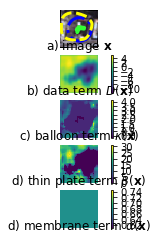

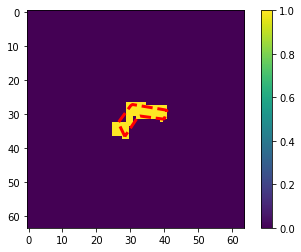

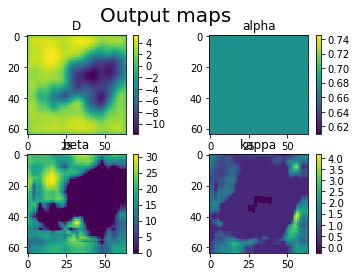

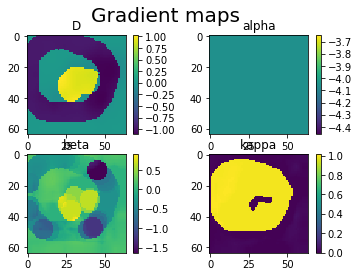

Train. Epoch 99. Iter 1/100, IoU = 0.03


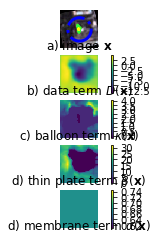

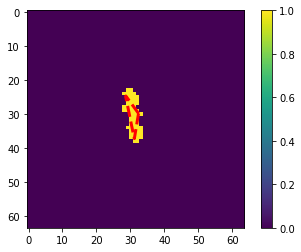

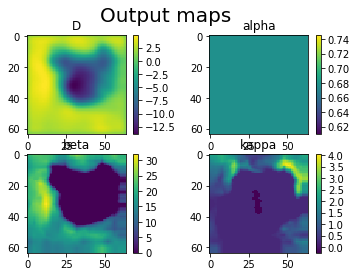

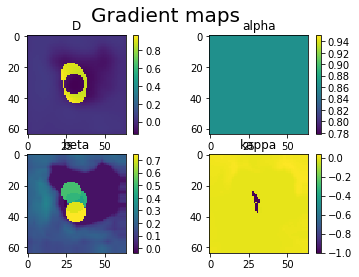

Train. Epoch 99. Iter 2/100, IoU = 0.03


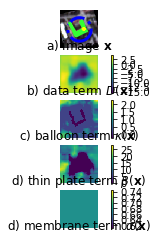

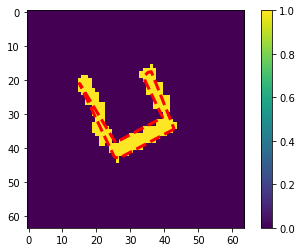

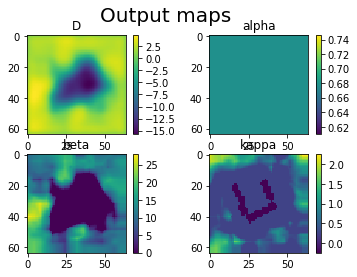

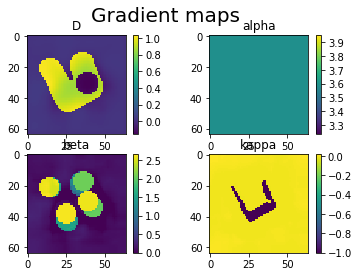

Train. Epoch 99. Iter 3/100, IoU = 0.03


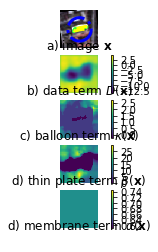

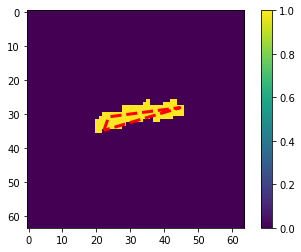

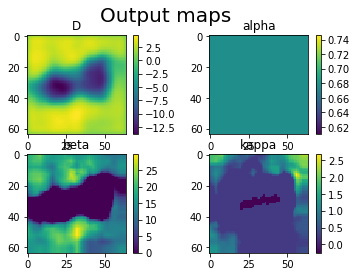

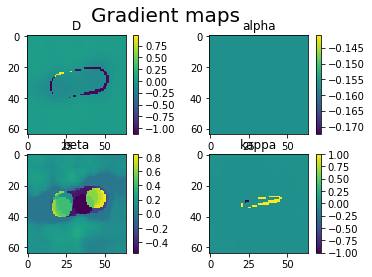

Train. Epoch 99. Iter 4/100, IoU = 0.16


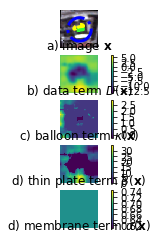

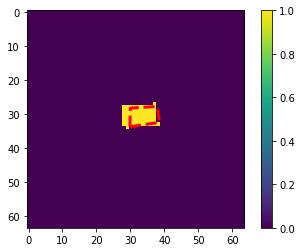

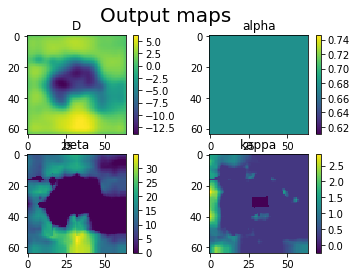

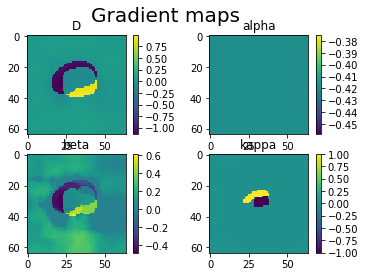

Train. Epoch 99. Iter 5/100, IoU = 0.13


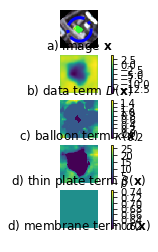

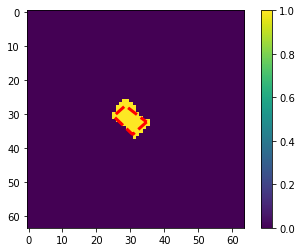

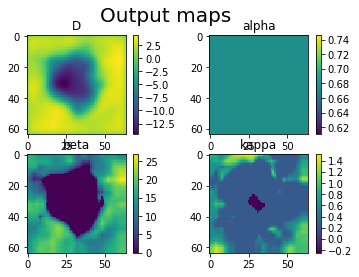

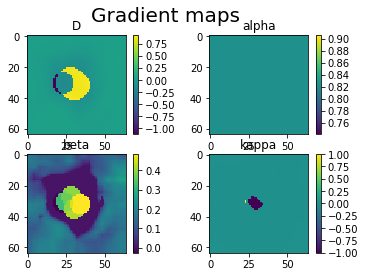

Train. Epoch 99. Iter 6/100, IoU = 0.11


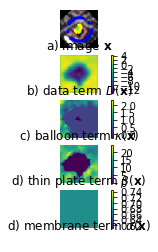

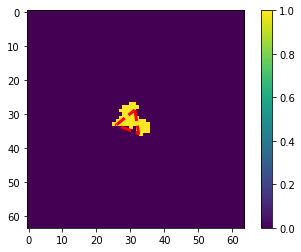

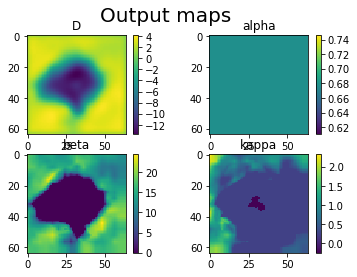

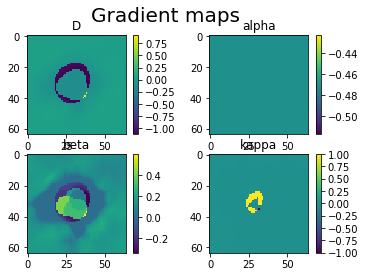

Train. Epoch 99. Iter 7/100, IoU = 0.14


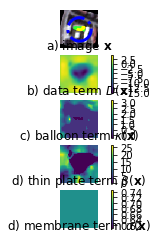

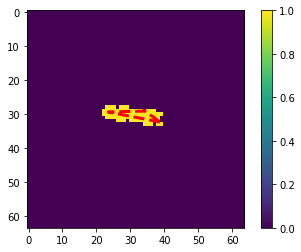

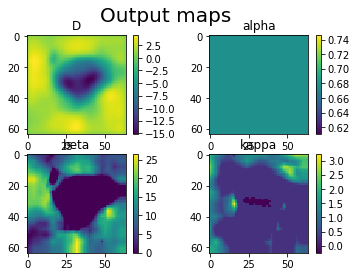

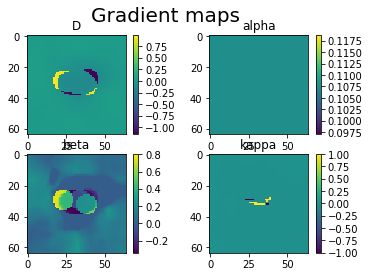

Train. Epoch 99. Iter 8/100, IoU = 0.18


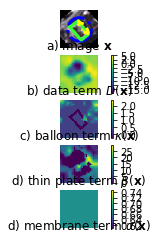

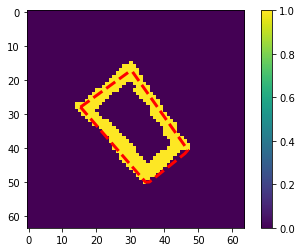

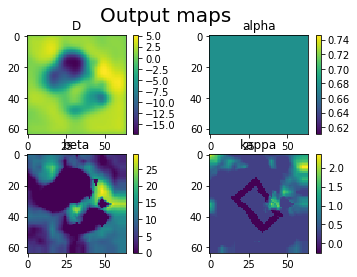

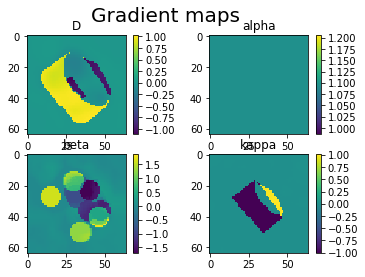

Train. Epoch 99. Iter 9/100, IoU = 0.18


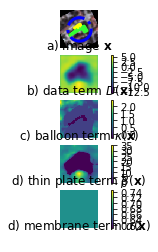

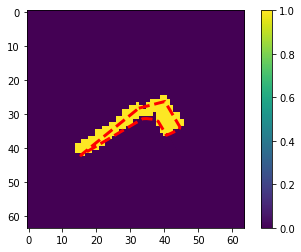

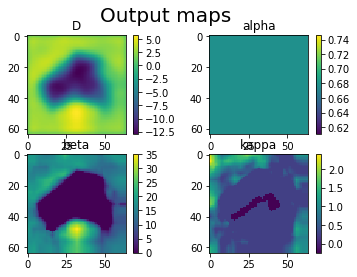

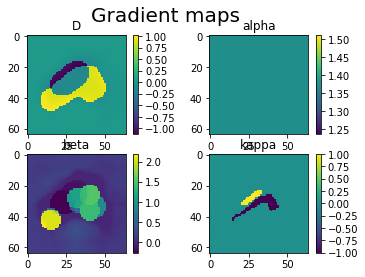

Train. Epoch 99. Iter 10/100, IoU = 0.16


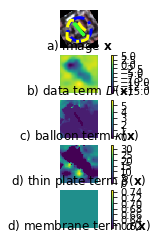

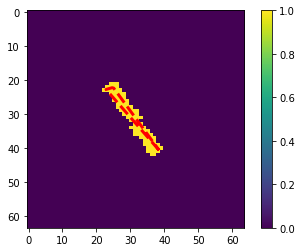

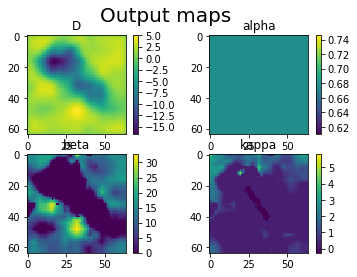

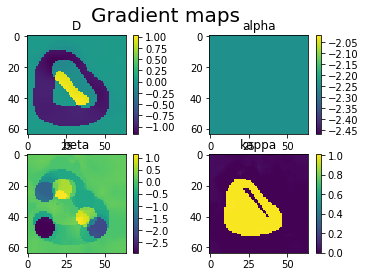

Train. Epoch 99. Iter 11/100, IoU = 0.15


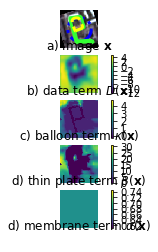

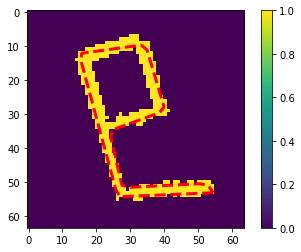

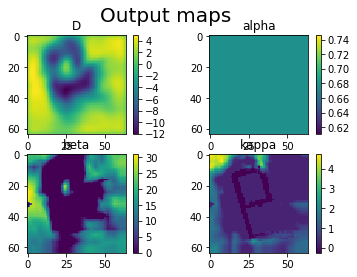

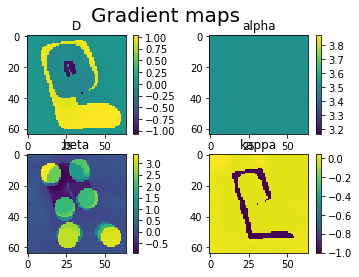

Train. Epoch 99. Iter 12/100, IoU = 0.18


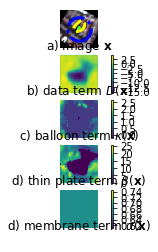

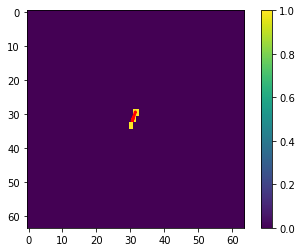

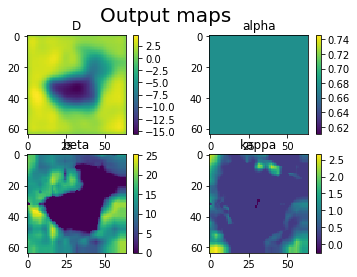

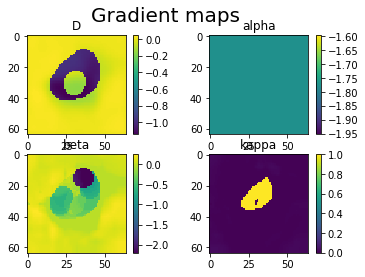

Train. Epoch 99. Iter 13/100, IoU = 0.17


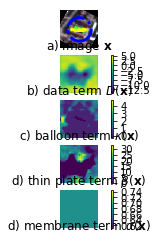

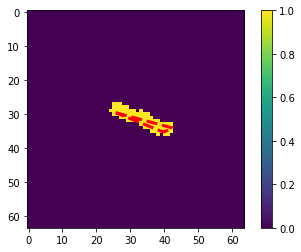

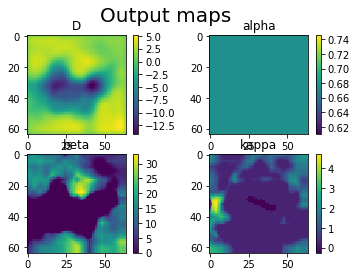

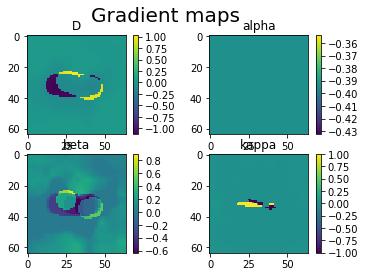

Train. Epoch 99. Iter 14/100, IoU = 0.16


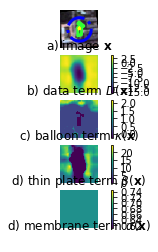

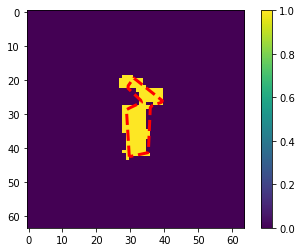

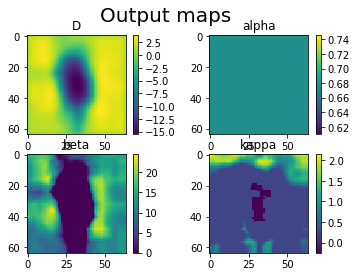

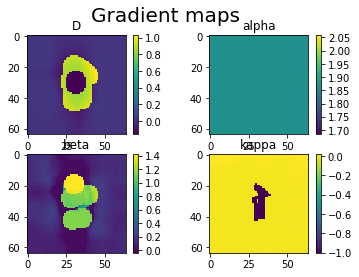

Train. Epoch 99. Iter 15/100, IoU = 0.15


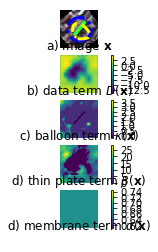

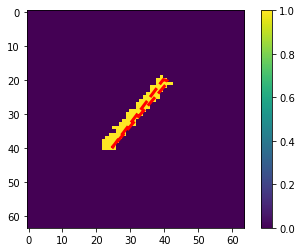

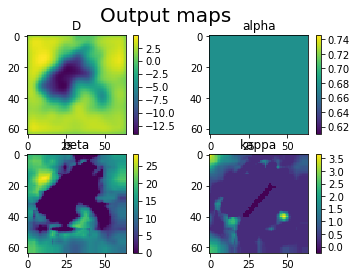

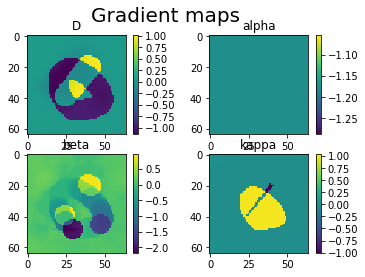

Train. Epoch 99. Iter 16/100, IoU = 0.15


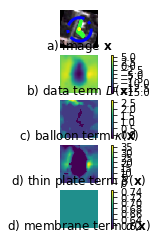

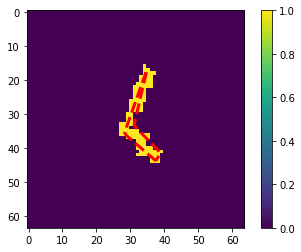

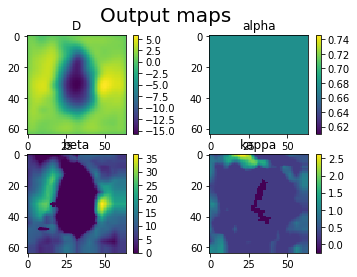

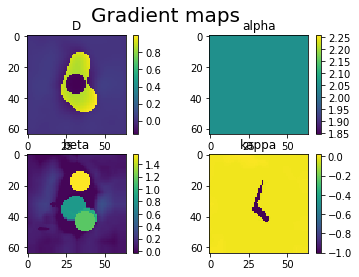

Train. Epoch 99. Iter 17/100, IoU = 0.14


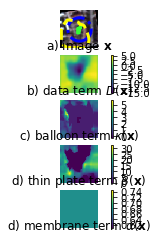

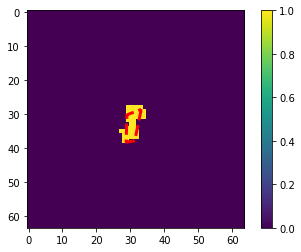

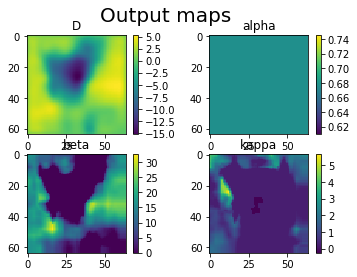

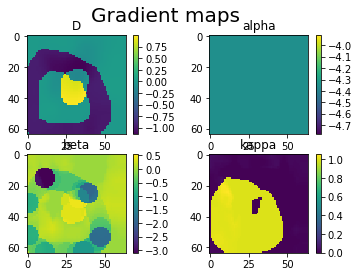

Train. Epoch 99. Iter 18/100, IoU = 0.13


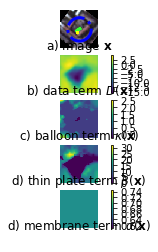

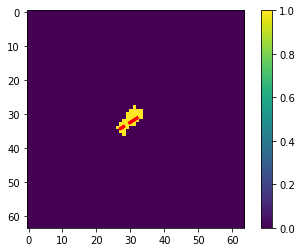

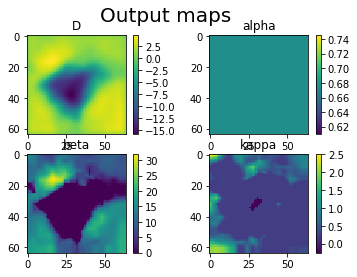

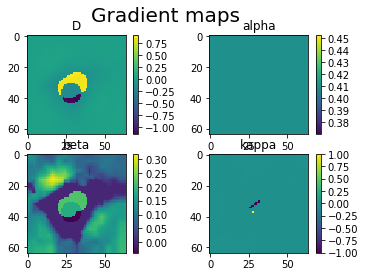

Train. Epoch 99. Iter 19/100, IoU = 0.13


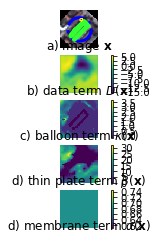

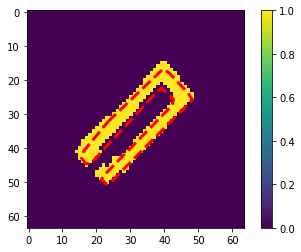

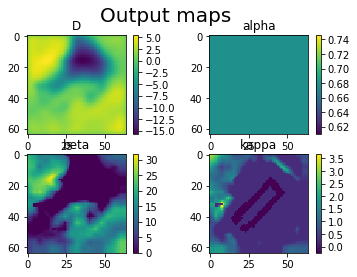

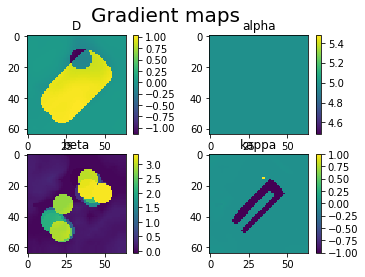

Train. Epoch 99. Iter 20/100, IoU = 0.12


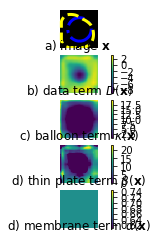

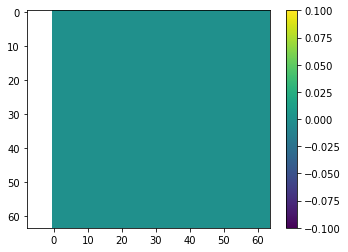

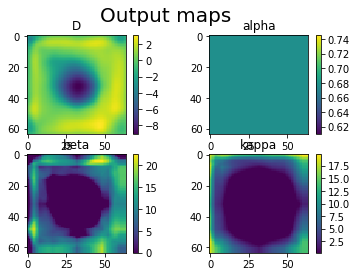

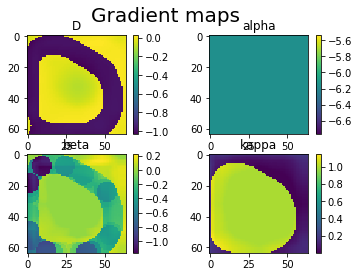

Train. Epoch 99. Iter 21/100, IoU = 0.11


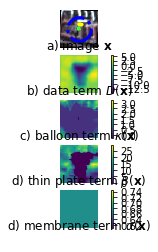

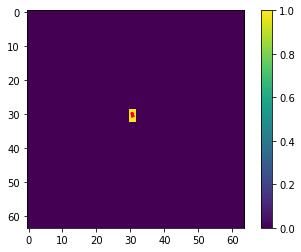

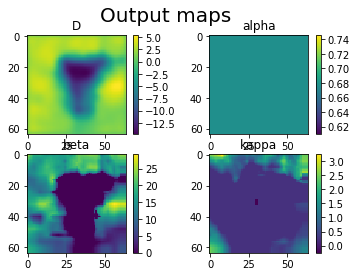

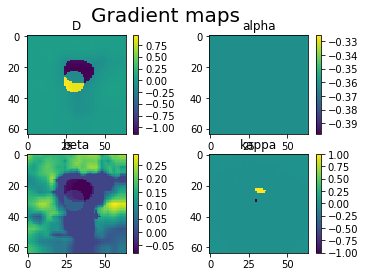

Train. Epoch 99. Iter 22/100, IoU = 0.11


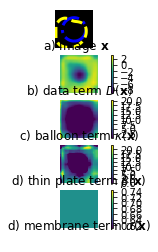

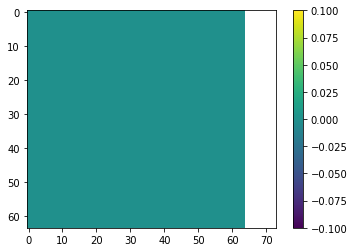

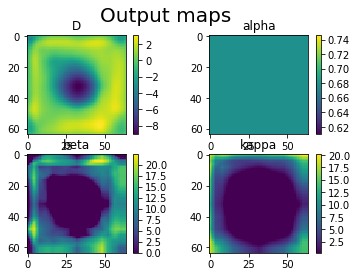

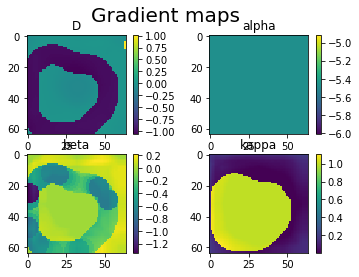

Train. Epoch 99. Iter 23/100, IoU = 0.10


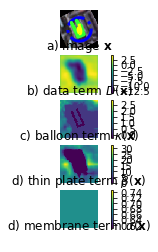

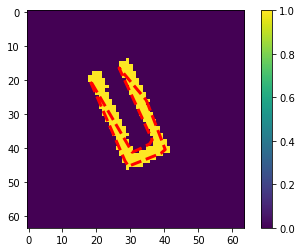

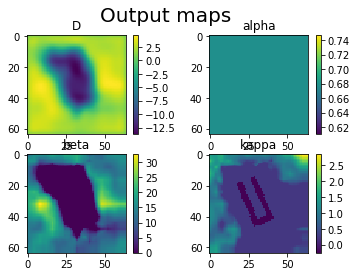

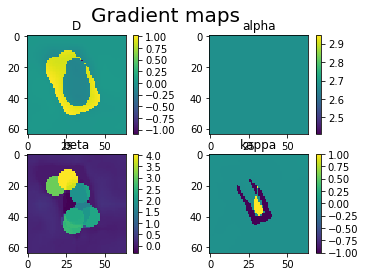

Train. Epoch 99. Iter 24/100, IoU = 0.10


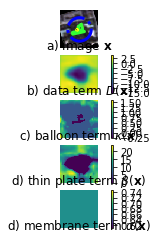

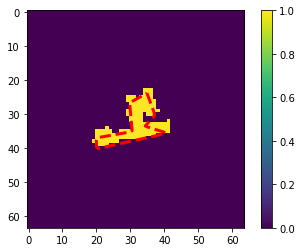

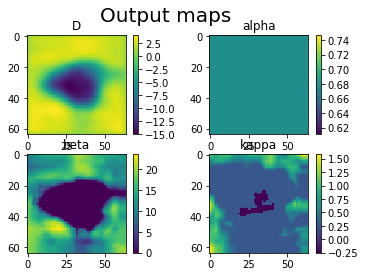

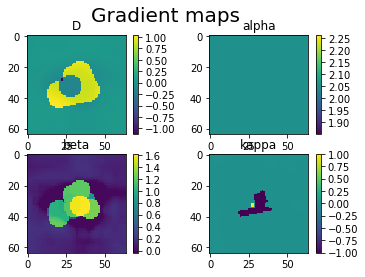

Train. Epoch 99. Iter 25/100, IoU = 0.10


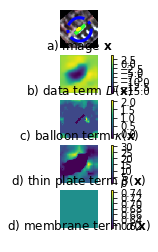

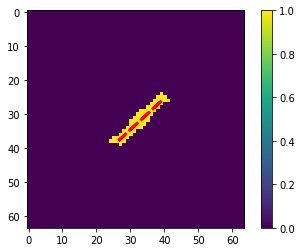

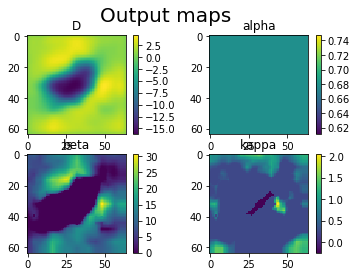

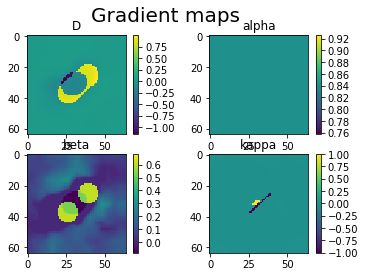

Train. Epoch 99. Iter 26/100, IoU = 0.09


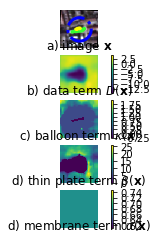

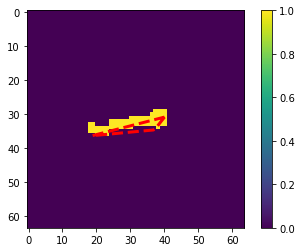

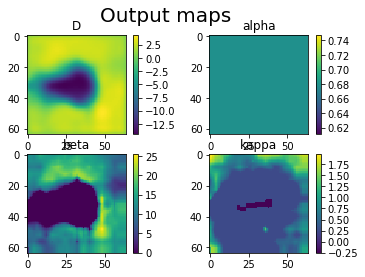

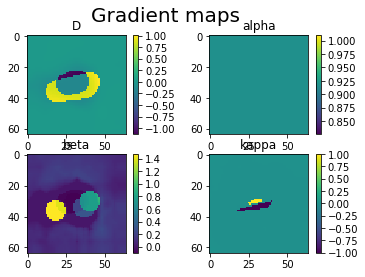

Train. Epoch 99. Iter 27/100, IoU = 0.09


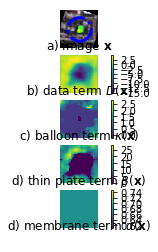

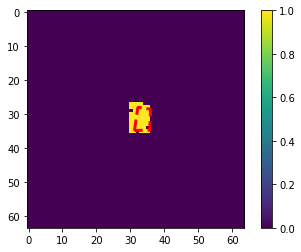

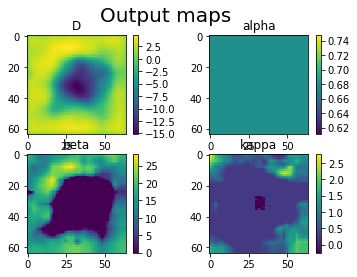

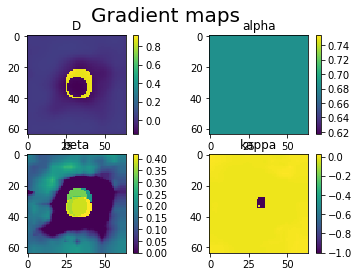

Train. Epoch 99. Iter 28/100, IoU = 0.09


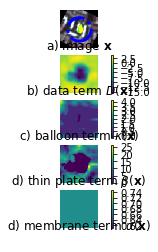

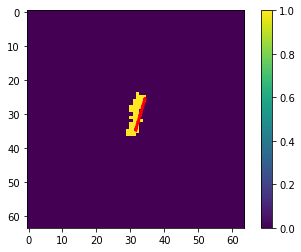

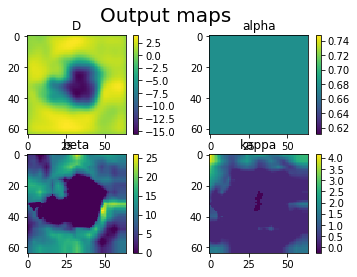

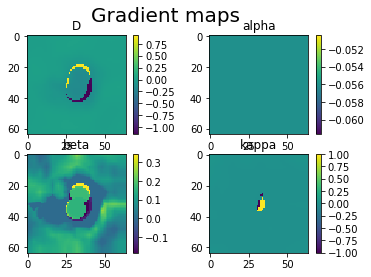

Train. Epoch 99. Iter 29/100, IoU = 0.09


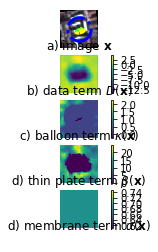

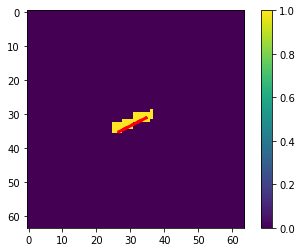

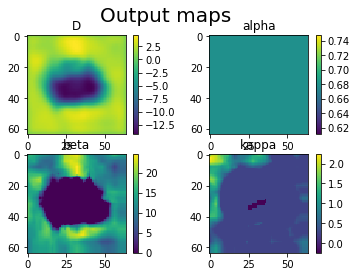

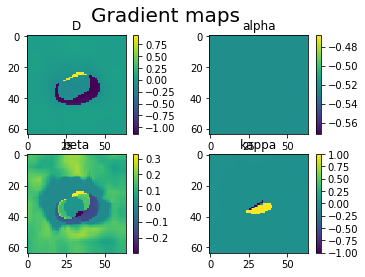

Train. Epoch 99. Iter 30/100, IoU = 0.09


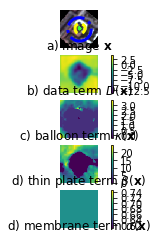

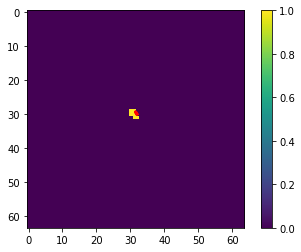

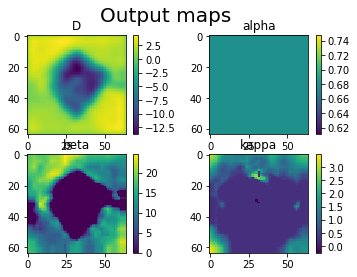

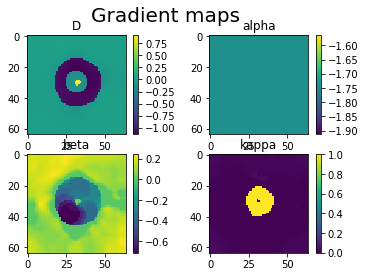

Train. Epoch 99. Iter 31/100, IoU = 0.08


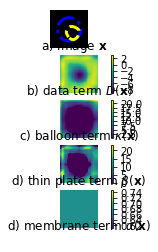

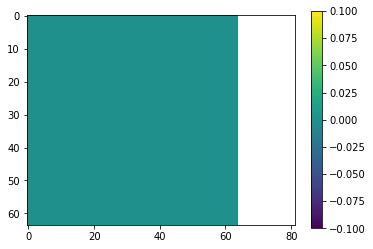

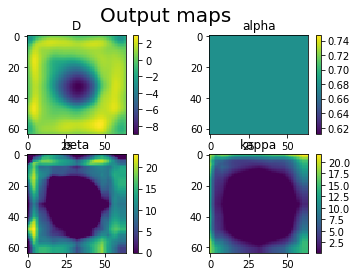

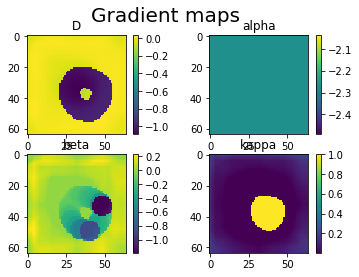

Train. Epoch 99. Iter 32/100, IoU = 0.08


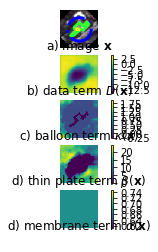

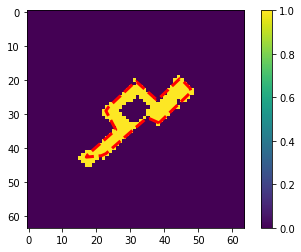

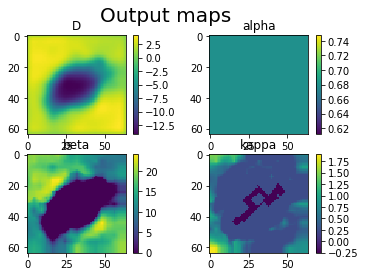

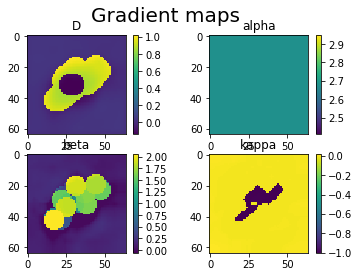

Train. Epoch 99. Iter 33/100, IoU = 0.08


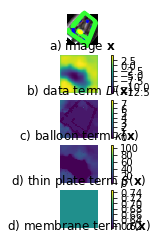

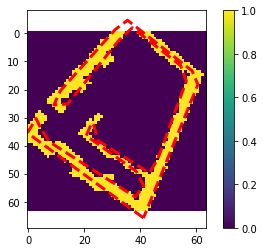

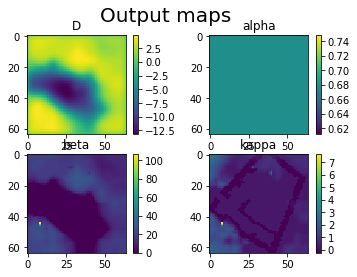

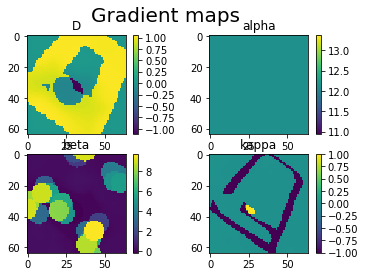

Train. Epoch 99. Iter 34/100, IoU = 0.08


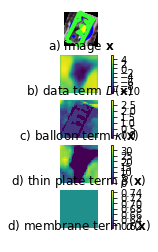

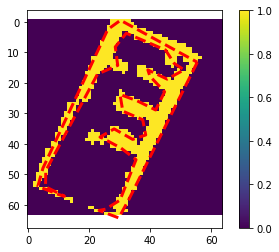

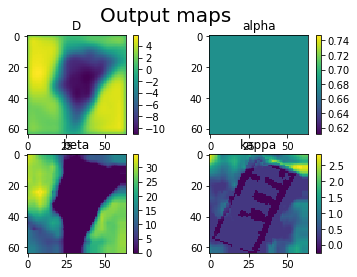

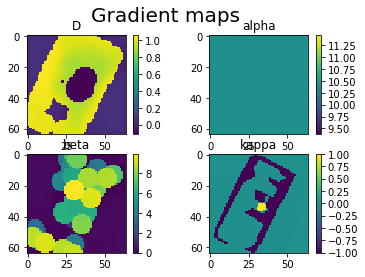

Train. Epoch 99. Iter 35/100, IoU = 0.08


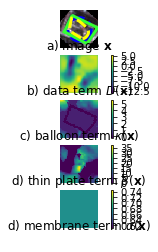

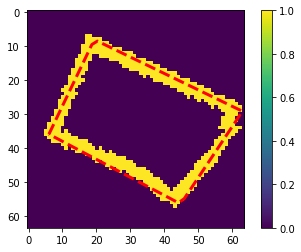

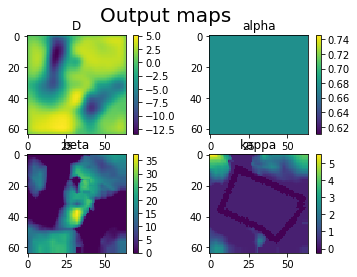

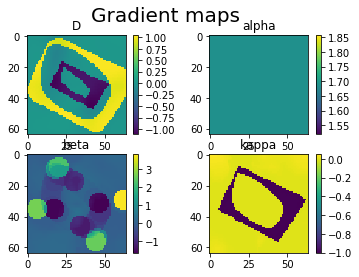

Train. Epoch 99. Iter 36/100, IoU = 0.09


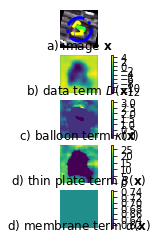

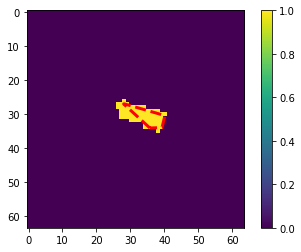

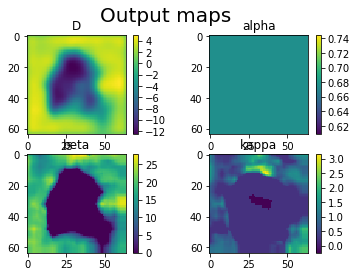

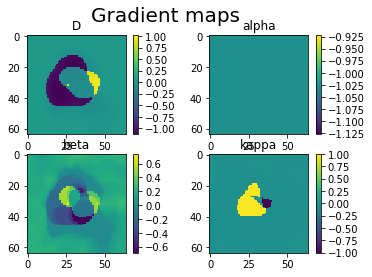

Train. Epoch 99. Iter 37/100, IoU = 0.09


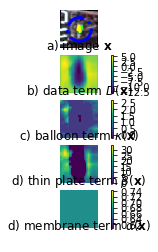

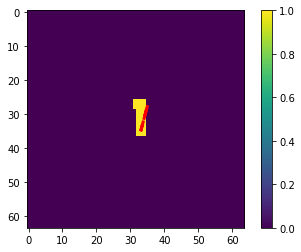

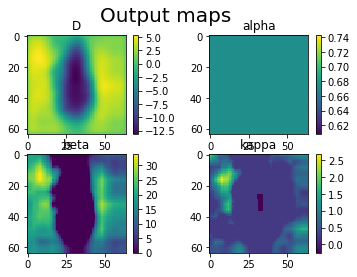

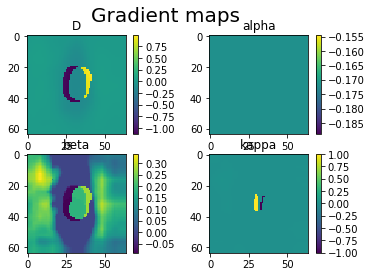

Train. Epoch 99. Iter 38/100, IoU = 0.08


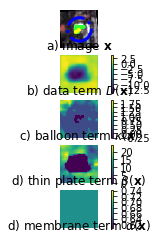

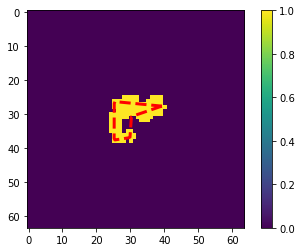

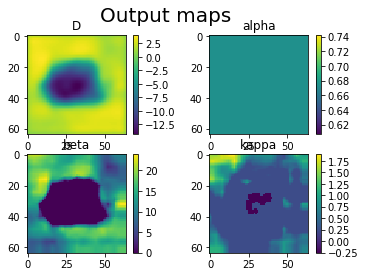

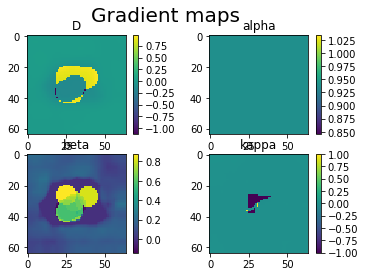

Train. Epoch 99. Iter 39/100, IoU = 0.09


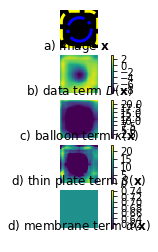

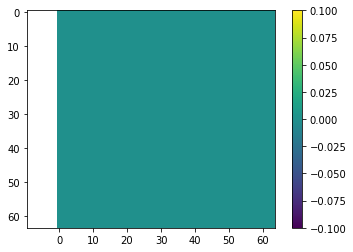

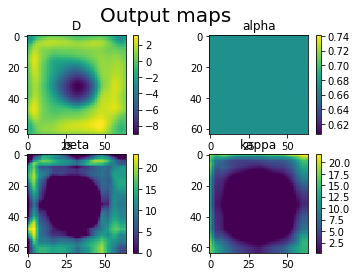

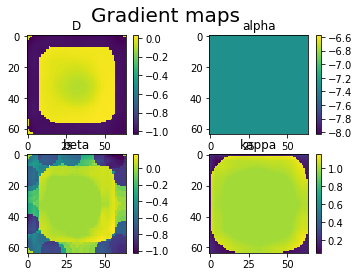

Train. Epoch 99. Iter 40/100, IoU = 0.08


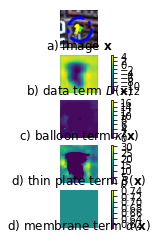

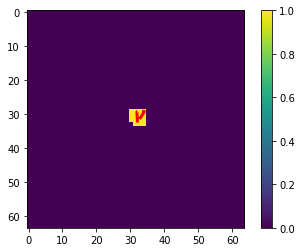

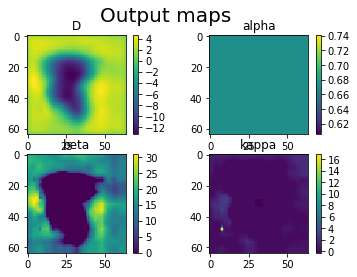

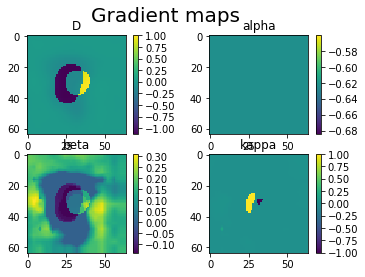

Train. Epoch 99. Iter 41/100, IoU = 0.08


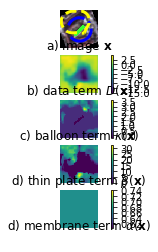

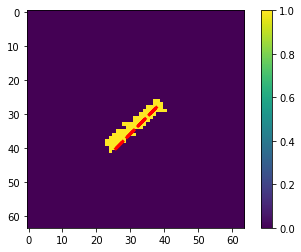

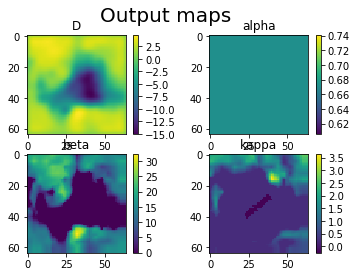

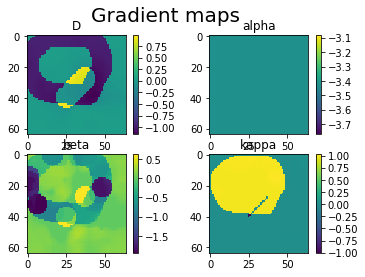

Train. Epoch 99. Iter 42/100, IoU = 0.08


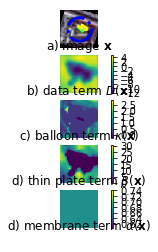

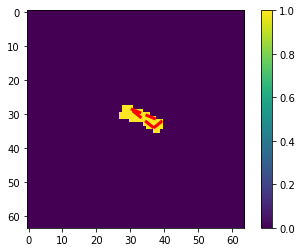

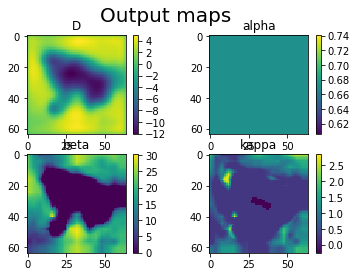

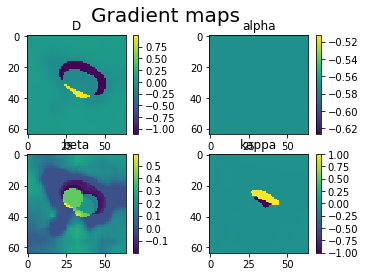

Train. Epoch 99. Iter 43/100, IoU = 0.08


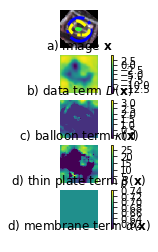

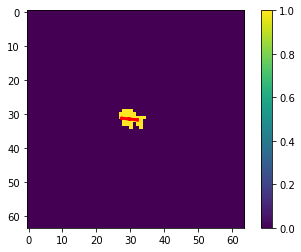

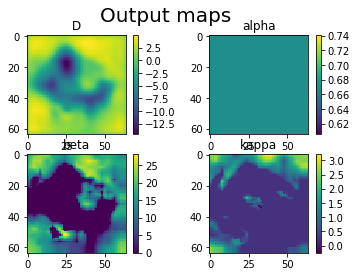

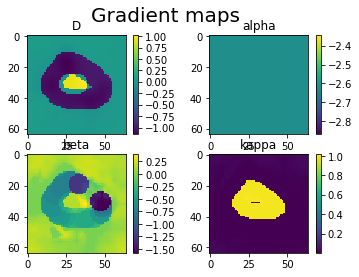

Train. Epoch 99. Iter 44/100, IoU = 0.08


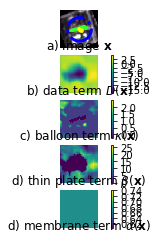

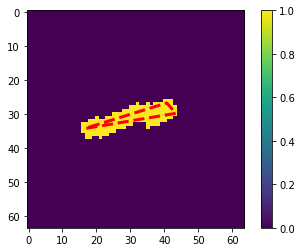

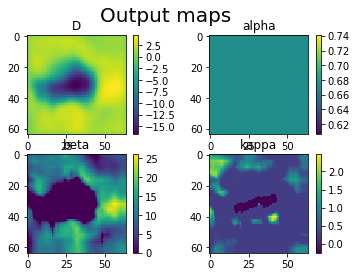

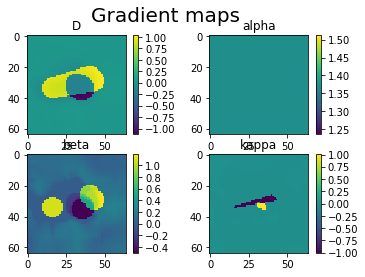

Train. Epoch 99. Iter 45/100, IoU = 0.08


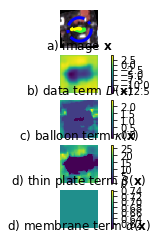

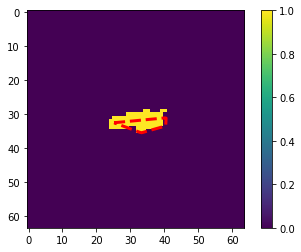

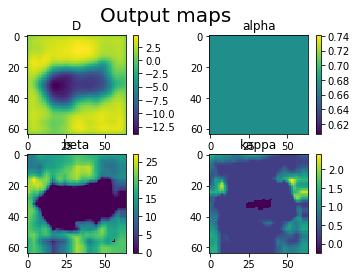

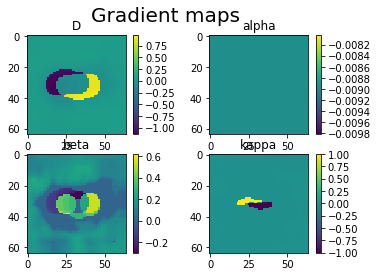

Train. Epoch 99. Iter 46/100, IoU = 0.07


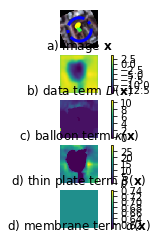

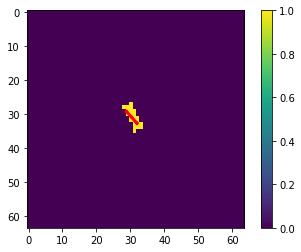

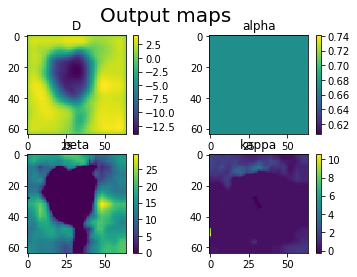

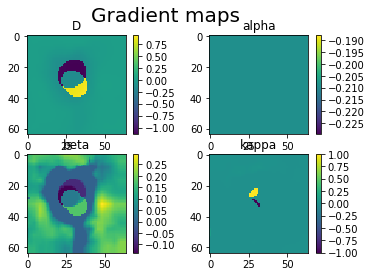

Train. Epoch 99. Iter 47/100, IoU = 0.07


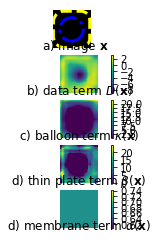

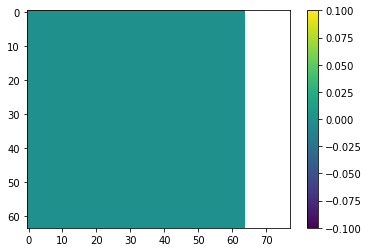

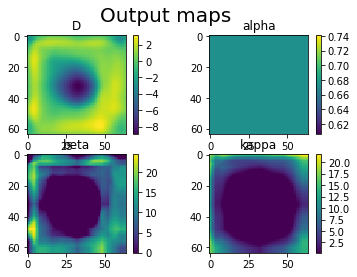

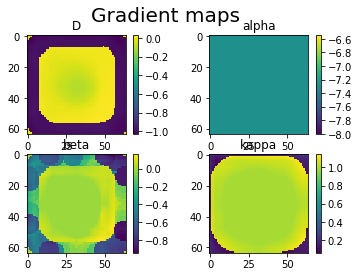

Train. Epoch 99. Iter 48/100, IoU = 0.07


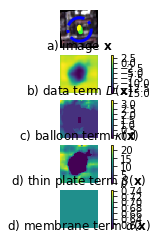

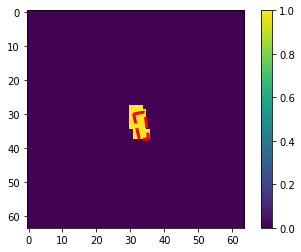

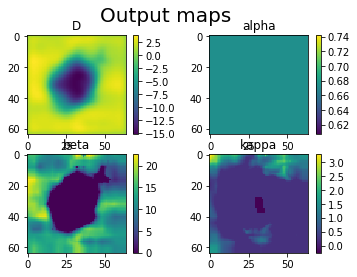

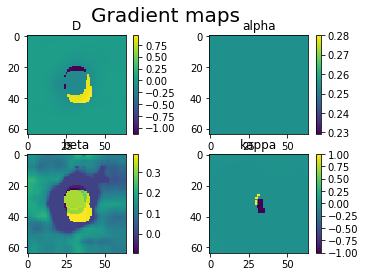

Train. Epoch 99. Iter 49/100, IoU = 0.07


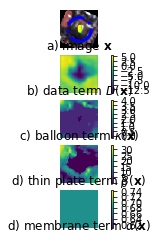

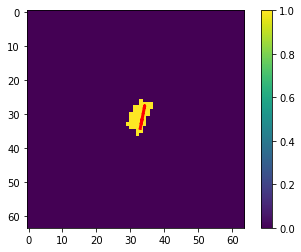

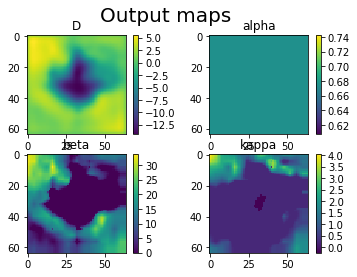

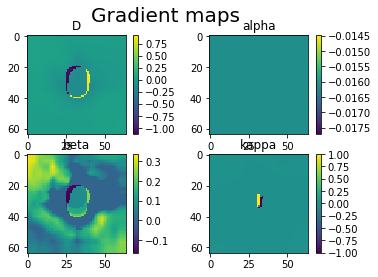

Train. Epoch 99. Iter 50/100, IoU = 0.07


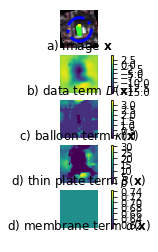

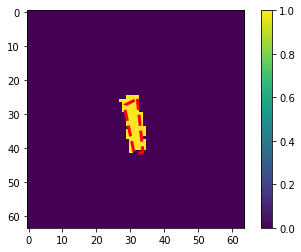

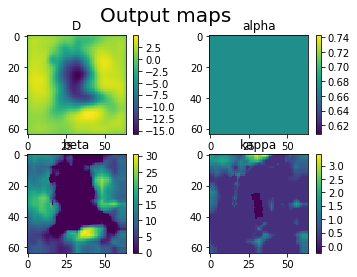

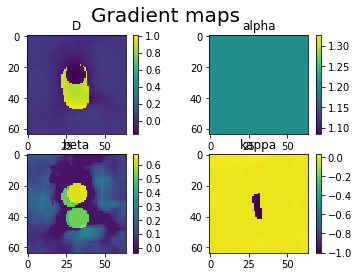

Train. Epoch 99. Iter 51/100, IoU = 0.07


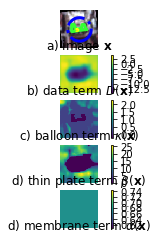

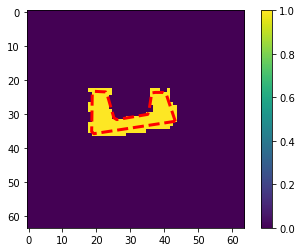

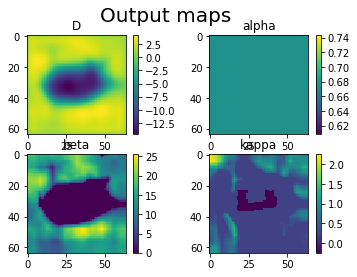

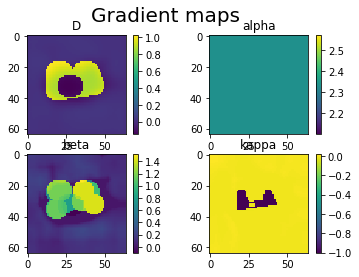

Train. Epoch 99. Iter 52/100, IoU = 0.07


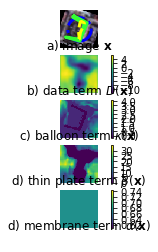

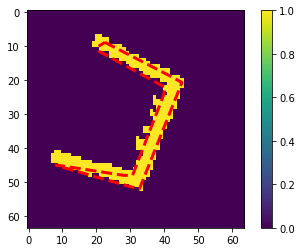

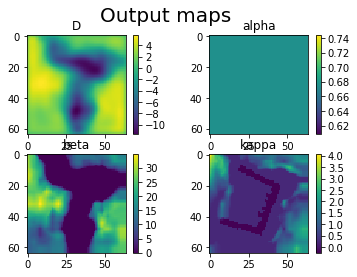

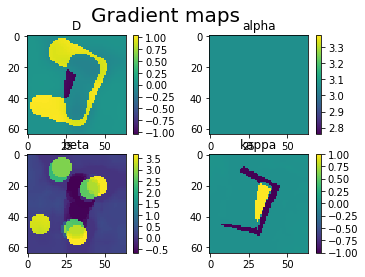

Train. Epoch 99. Iter 53/100, IoU = 0.07


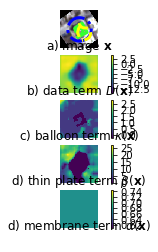

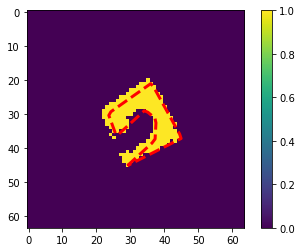

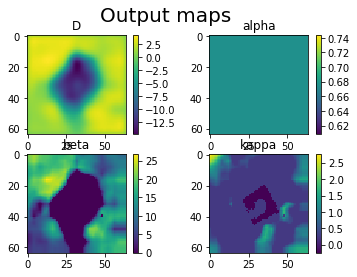

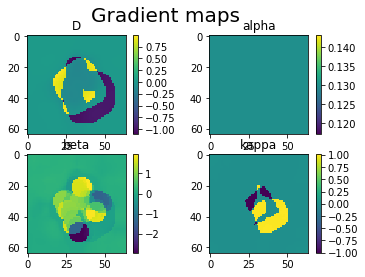

Train. Epoch 99. Iter 54/100, IoU = 0.07


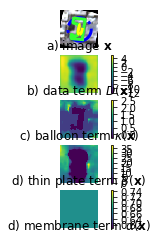

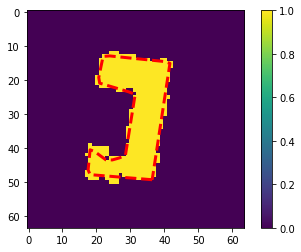

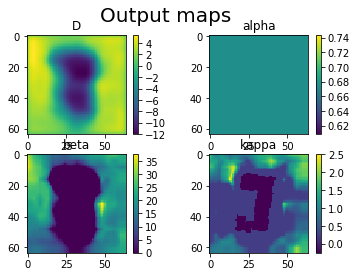

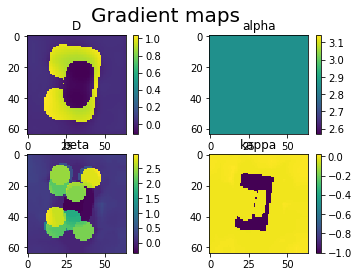

Train. Epoch 99. Iter 55/100, IoU = 0.08


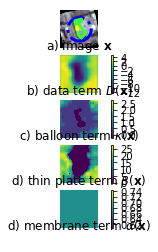

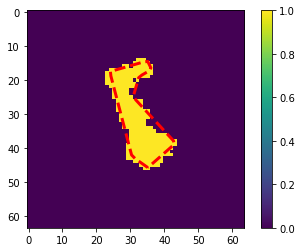

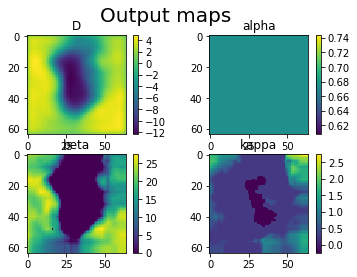

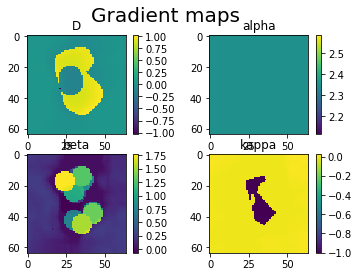

Train. Epoch 99. Iter 56/100, IoU = 0.08


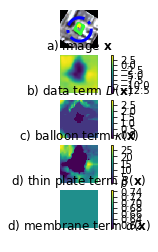

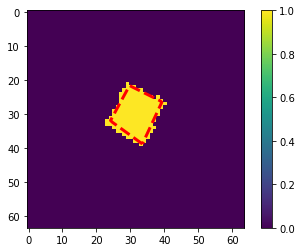

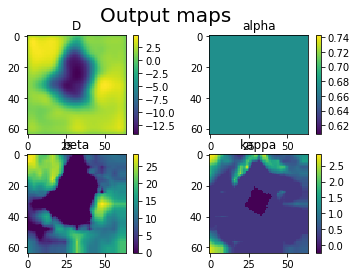

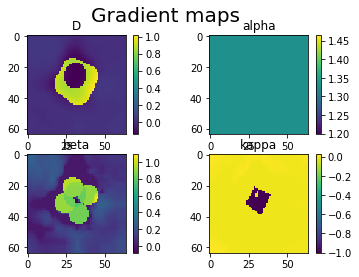

Train. Epoch 99. Iter 57/100, IoU = 0.07


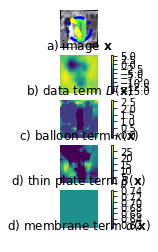

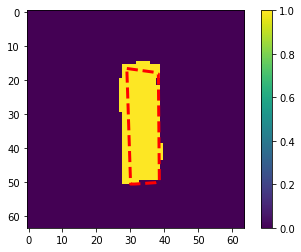

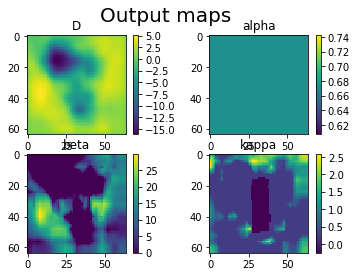

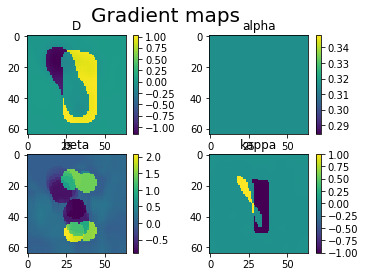

Train. Epoch 99. Iter 58/100, IoU = 0.08


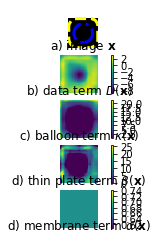

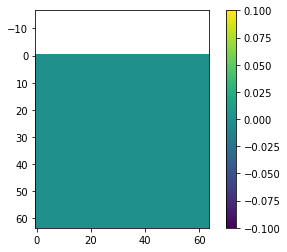

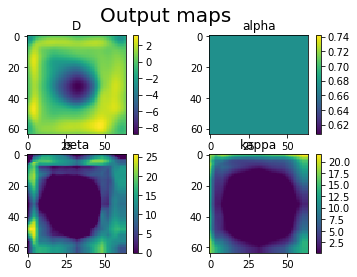

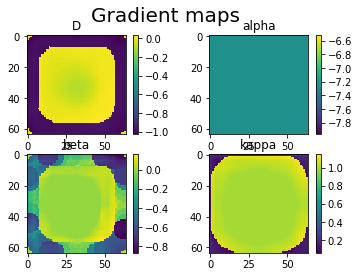

Train. Epoch 99. Iter 59/100, IoU = 0.07


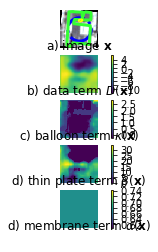

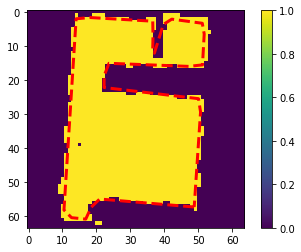

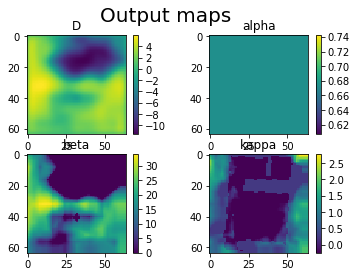

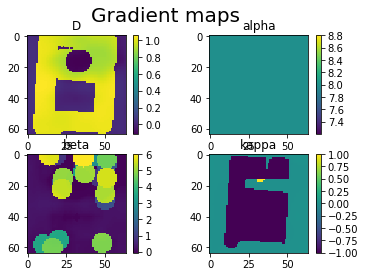

Train. Epoch 99. Iter 60/100, IoU = 0.07


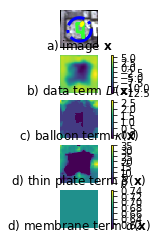

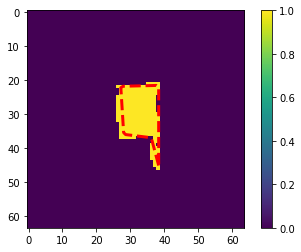

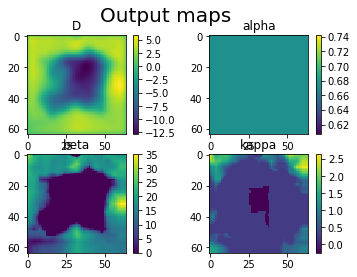

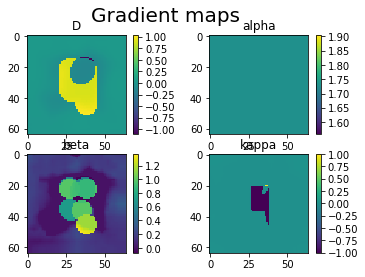

Train. Epoch 99. Iter 61/100, IoU = 0.07


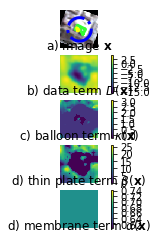

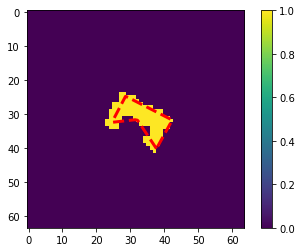

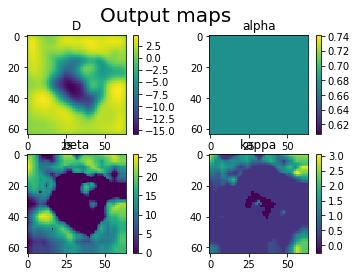

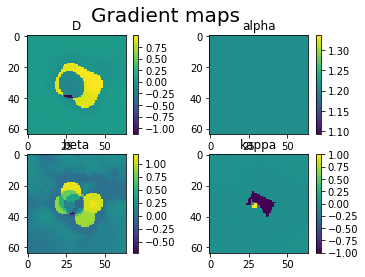

Train. Epoch 99. Iter 62/100, IoU = 0.07


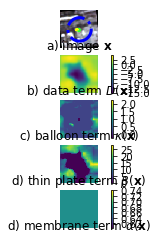

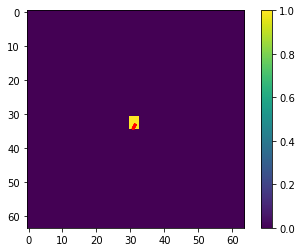

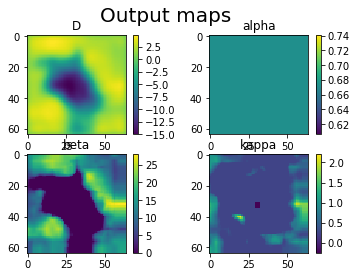

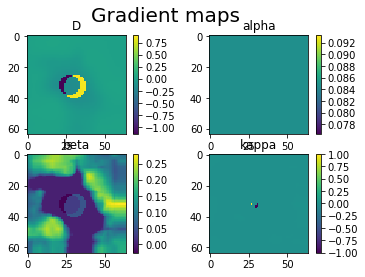

Train. Epoch 99. Iter 63/100, IoU = 0.07


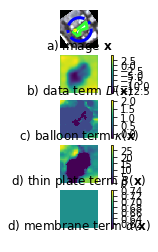

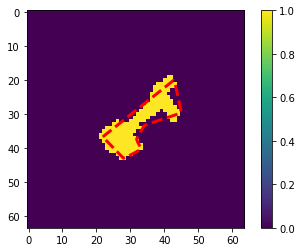

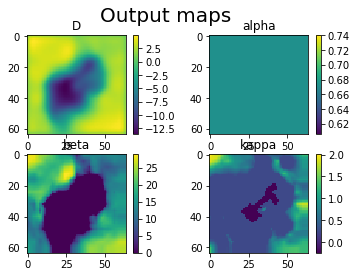

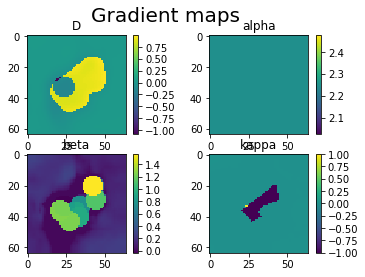

Train. Epoch 99. Iter 64/100, IoU = 0.07


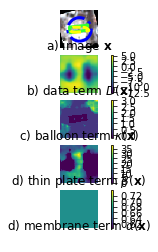

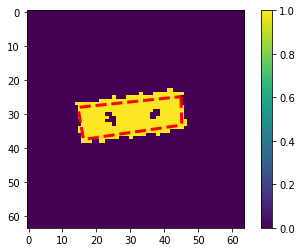

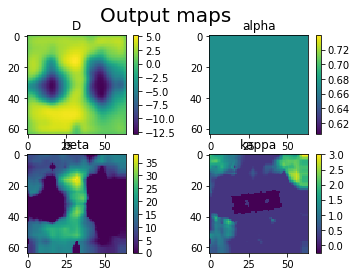

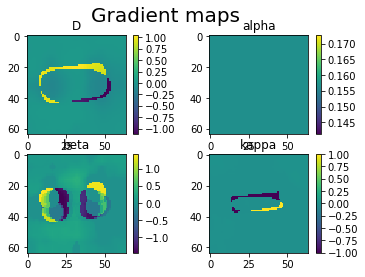

Train. Epoch 99. Iter 65/100, IoU = 0.08


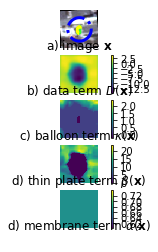

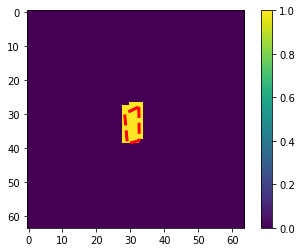

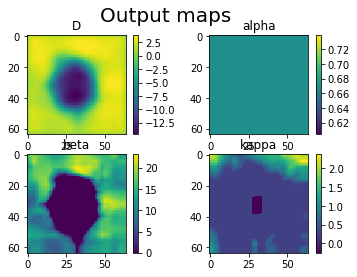

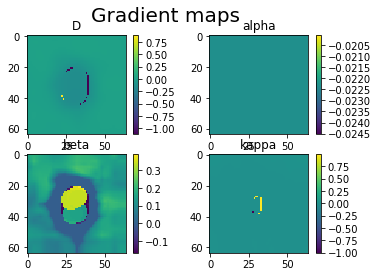

Train. Epoch 99. Iter 66/100, IoU = 0.09


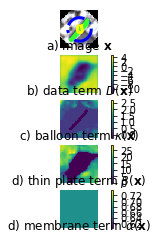

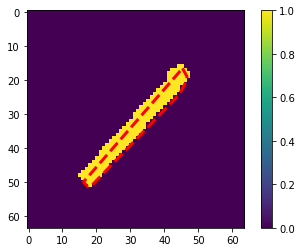

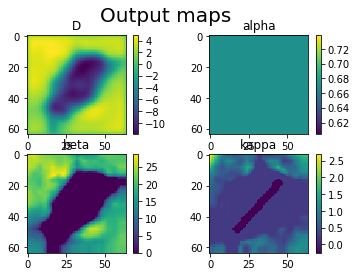

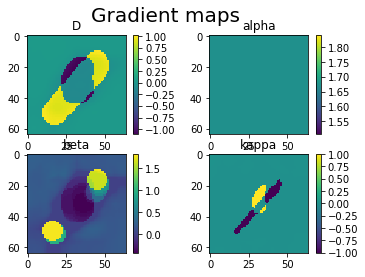

Train. Epoch 99. Iter 67/100, IoU = 0.09


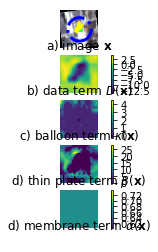

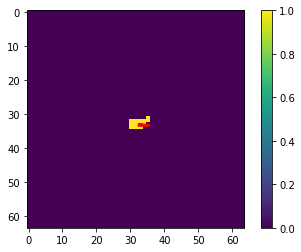

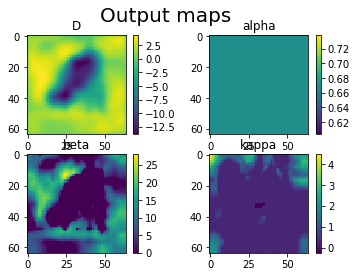

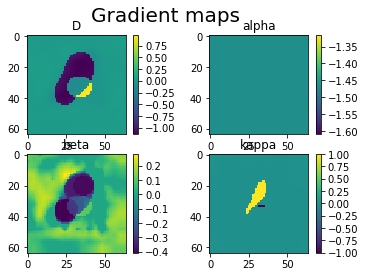

Train. Epoch 99. Iter 68/100, IoU = 0.09


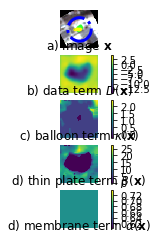

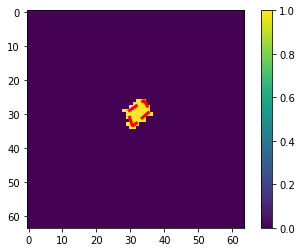

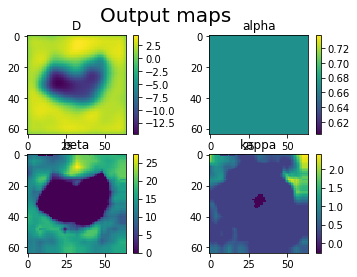

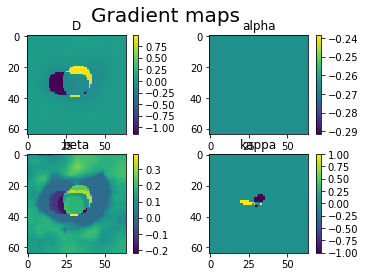

Train. Epoch 99. Iter 69/100, IoU = 0.09


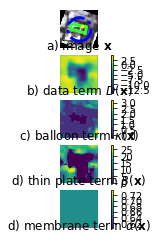

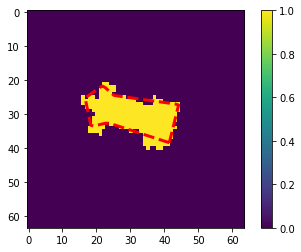

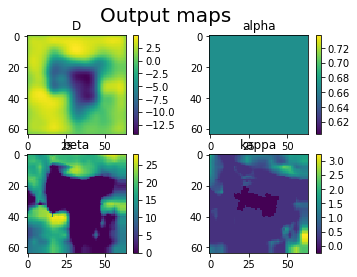

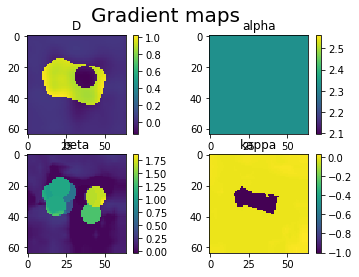

Train. Epoch 99. Iter 70/100, IoU = 0.09


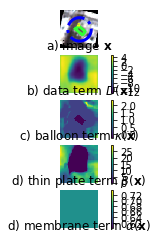

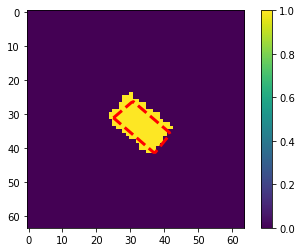

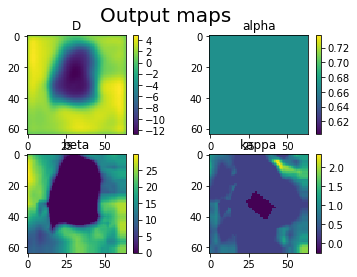

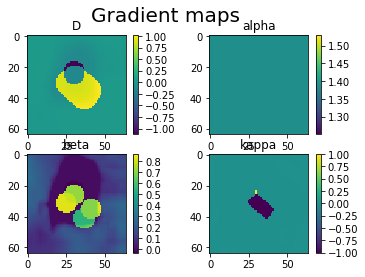

Train. Epoch 99. Iter 71/100, IoU = 0.09


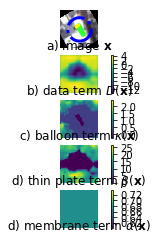

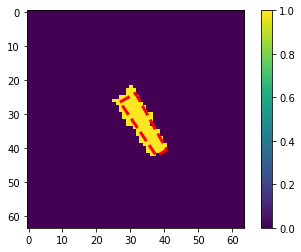

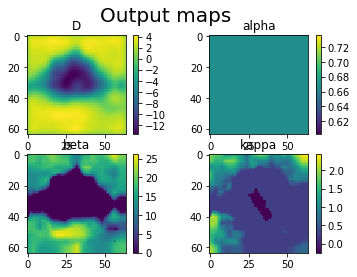

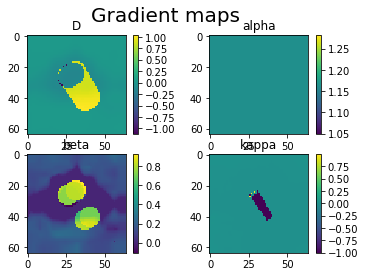

Train. Epoch 99. Iter 72/100, IoU = 0.09


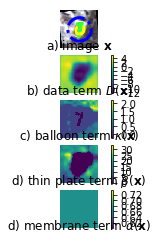

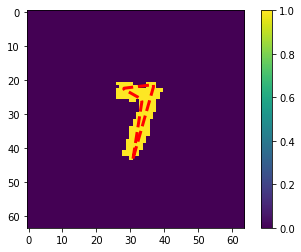

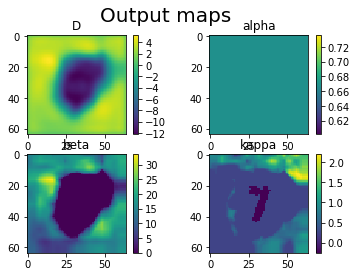

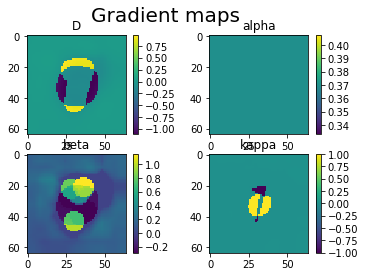

Train. Epoch 99. Iter 73/100, IoU = 0.09


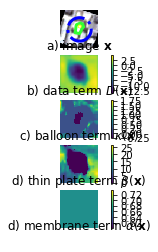

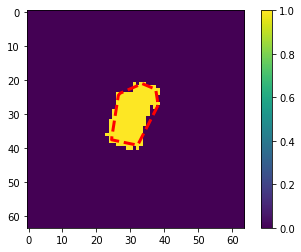

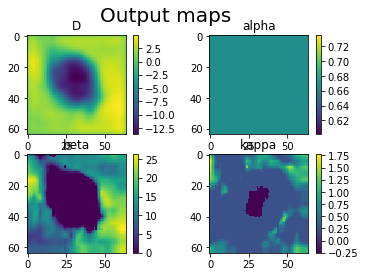

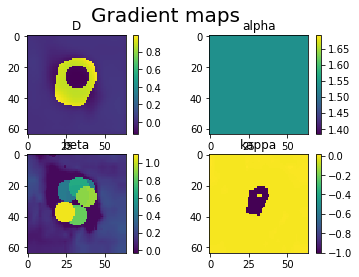

Train. Epoch 99. Iter 74/100, IoU = 0.09


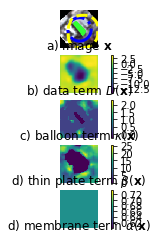

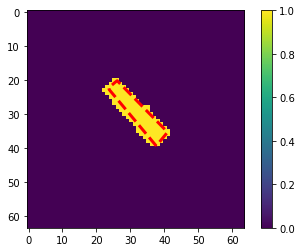

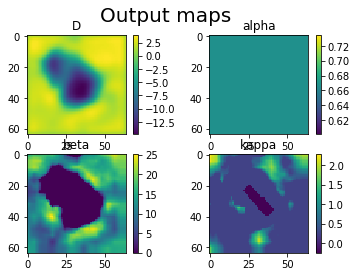

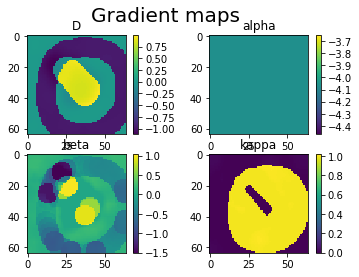

Train. Epoch 99. Iter 75/100, IoU = 0.09


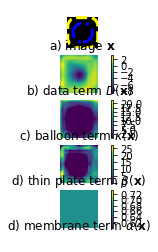

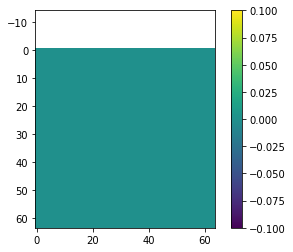

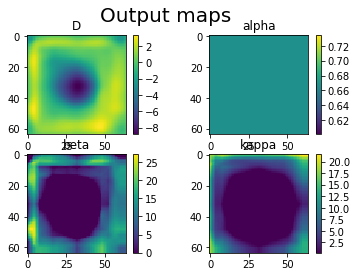

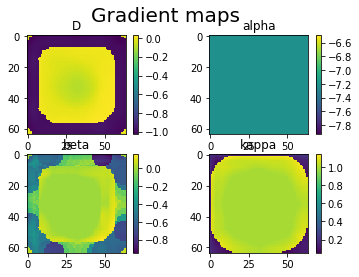

Train. Epoch 99. Iter 76/100, IoU = 0.09


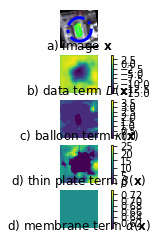

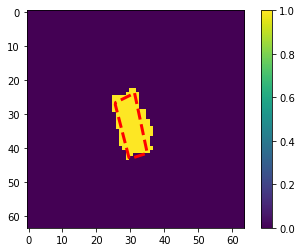

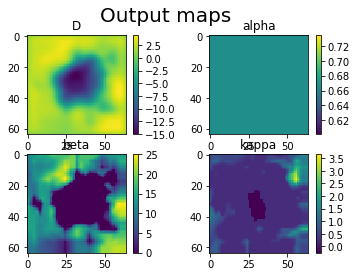

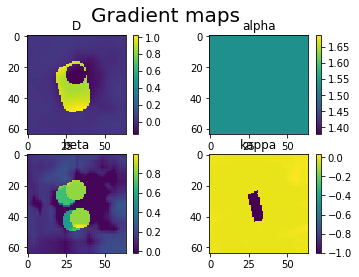

Train. Epoch 99. Iter 77/100, IoU = 0.08


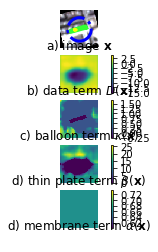

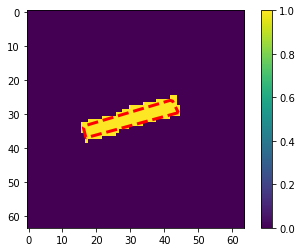

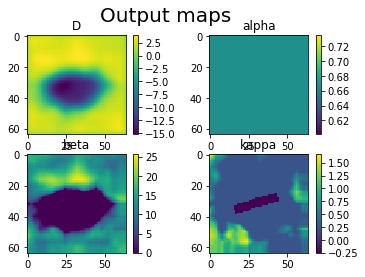

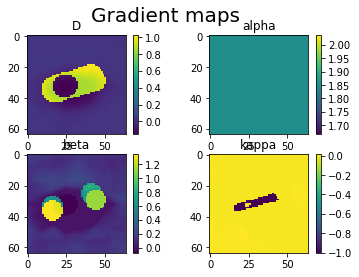

Train. Epoch 99. Iter 78/100, IoU = 0.08


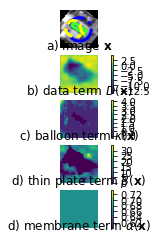

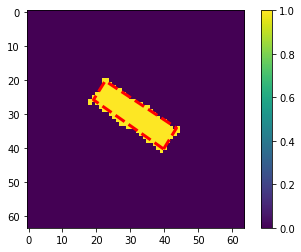

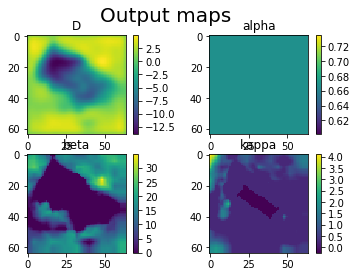

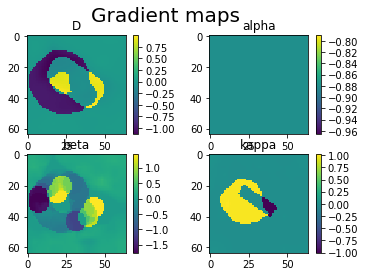

Train. Epoch 99. Iter 79/100, IoU = 0.09


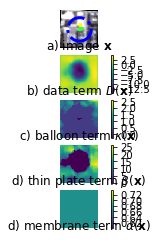

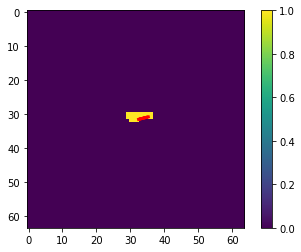

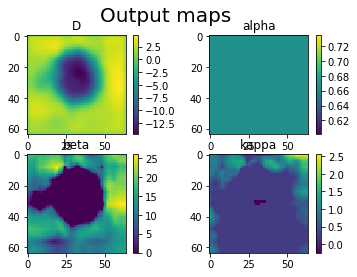

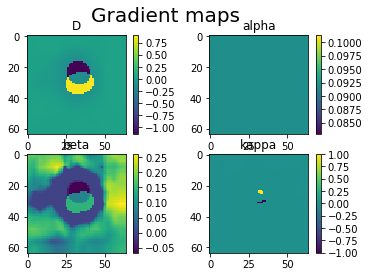

Train. Epoch 99. Iter 80/100, IoU = 0.08


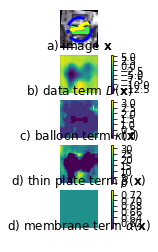

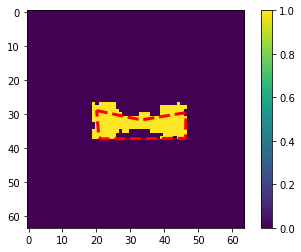

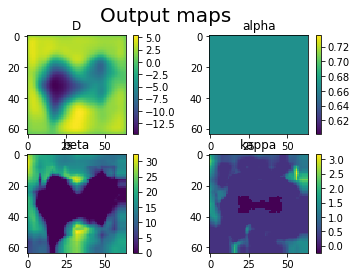

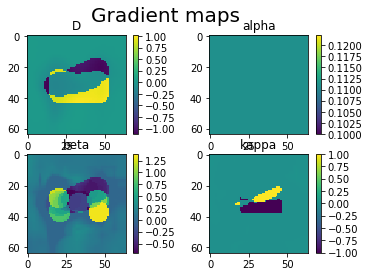

Train. Epoch 99. Iter 81/100, IoU = 0.08


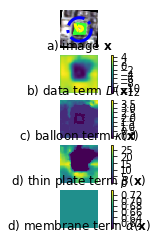

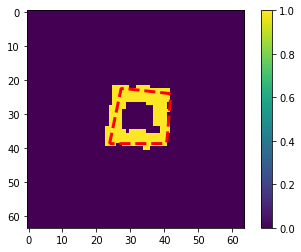

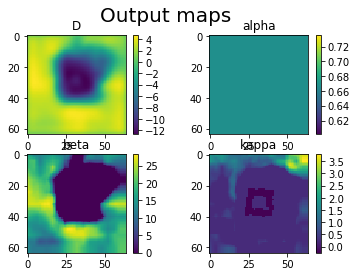

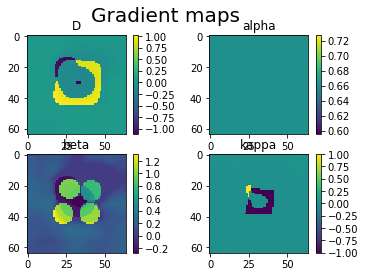

Train. Epoch 99. Iter 82/100, IoU = 0.09


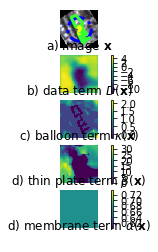

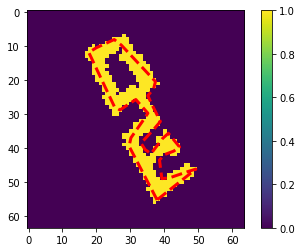

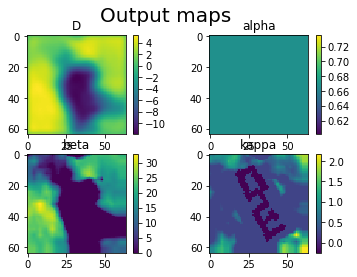

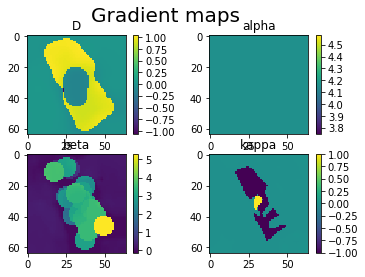

Train. Epoch 99. Iter 83/100, IoU = 0.09


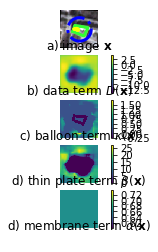

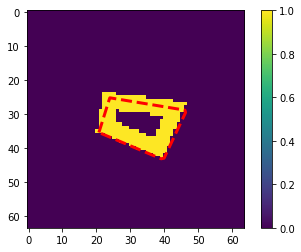

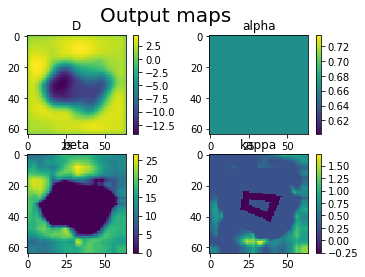

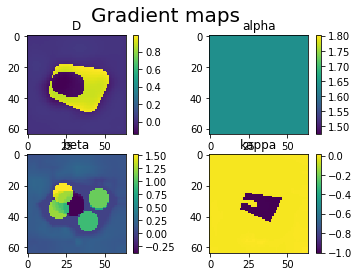

Train. Epoch 99. Iter 84/100, IoU = 0.09


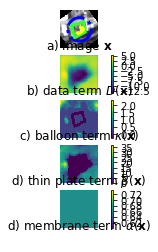

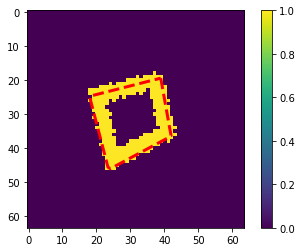

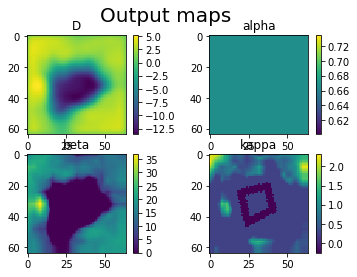

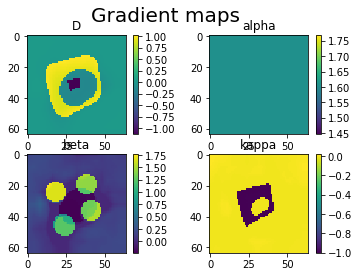

Train. Epoch 99. Iter 85/100, IoU = 0.09


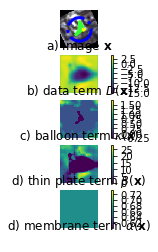

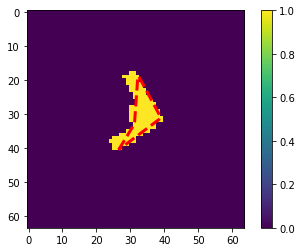

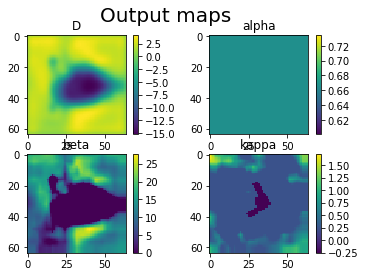

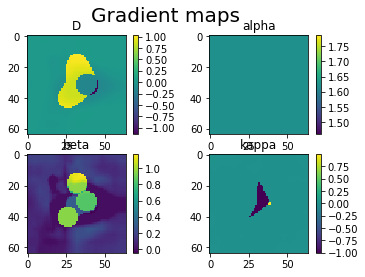

Train. Epoch 99. Iter 86/100, IoU = 0.09


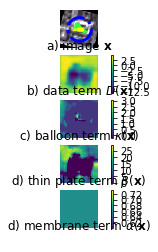

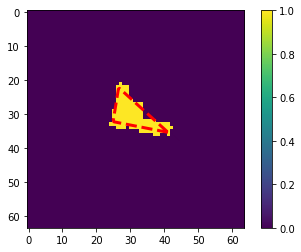

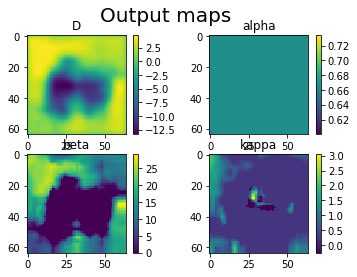

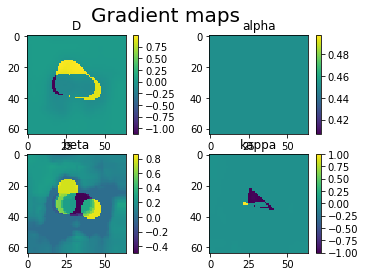

Train. Epoch 99. Iter 87/100, IoU = 0.09


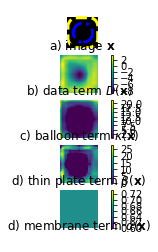

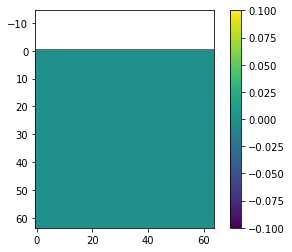

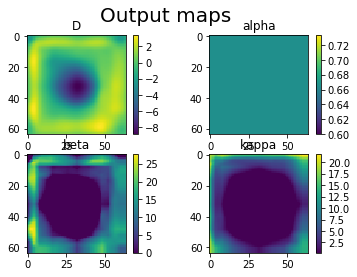

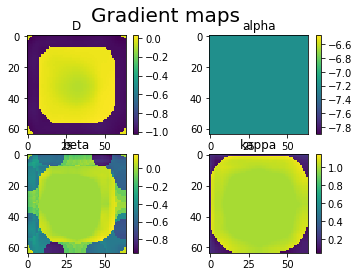

Train. Epoch 99. Iter 88/100, IoU = 0.09


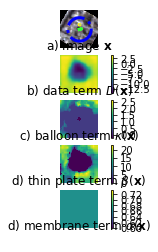

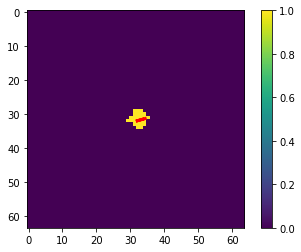

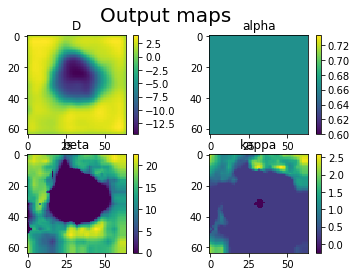

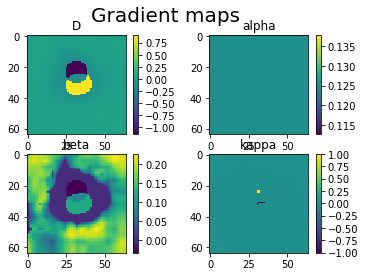

Train. Epoch 99. Iter 89/100, IoU = 0.09


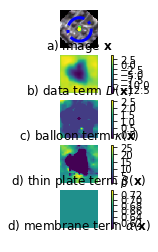

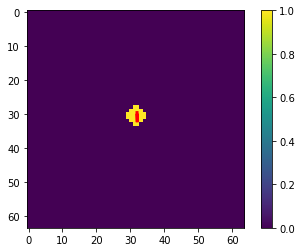

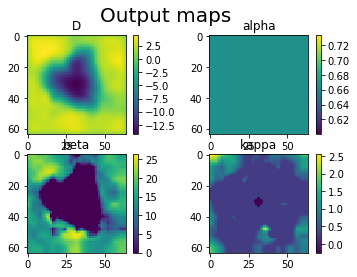

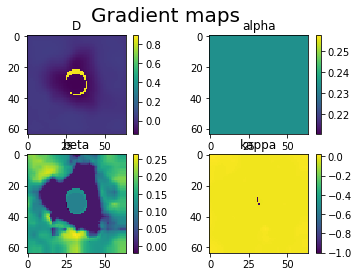

Train. Epoch 99. Iter 90/100, IoU = 0.09


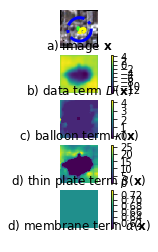

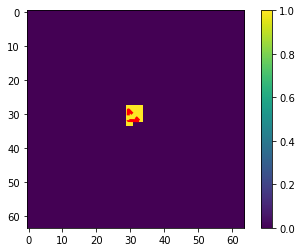

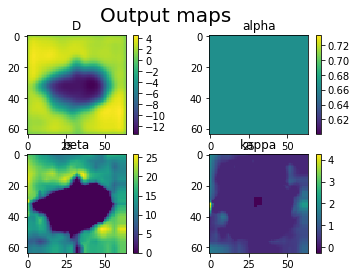

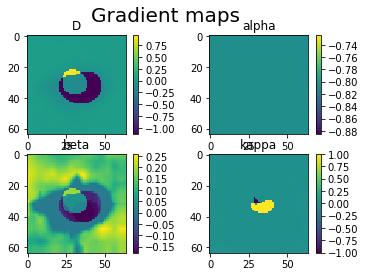

Train. Epoch 99. Iter 91/100, IoU = 0.09


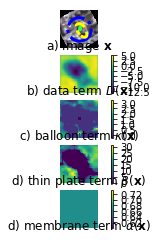

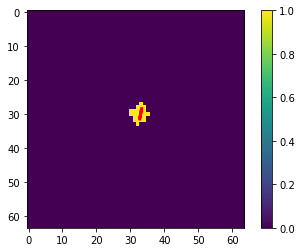

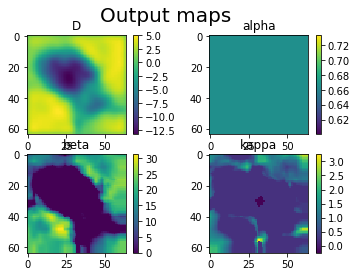

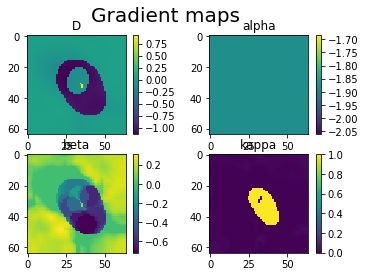

Train. Epoch 99. Iter 92/100, IoU = 0.09


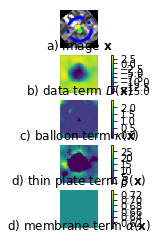

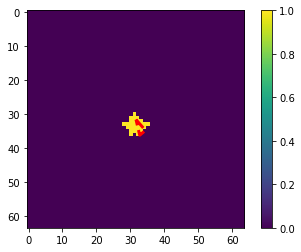

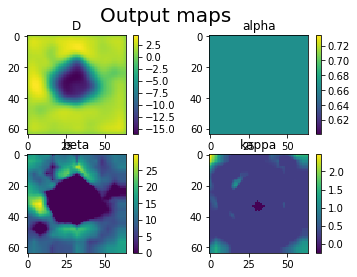

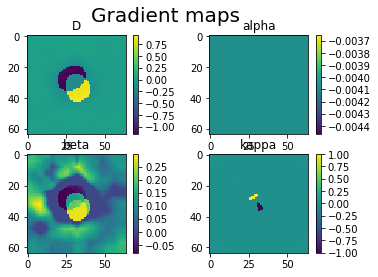

Train. Epoch 99. Iter 93/100, IoU = 0.09


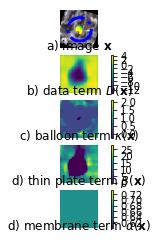

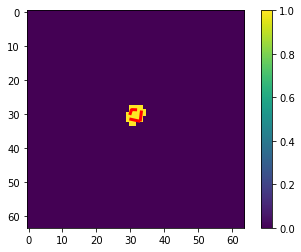

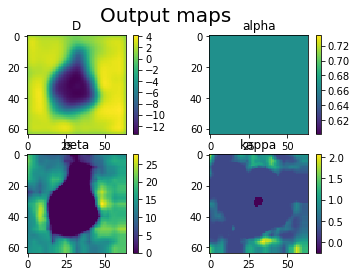

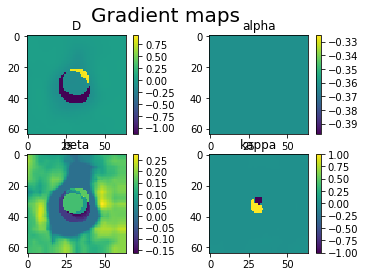

Train. Epoch 99. Iter 94/100, IoU = 0.09


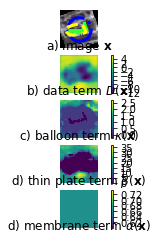

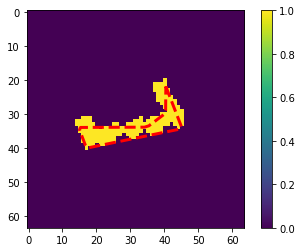

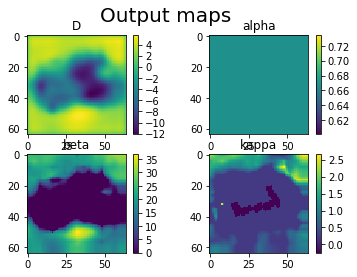

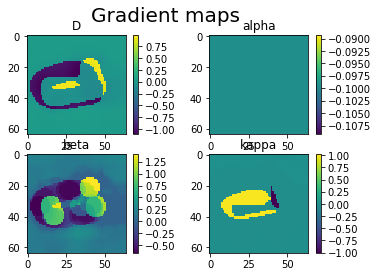

Train. Epoch 99. Iter 95/100, IoU = 0.09


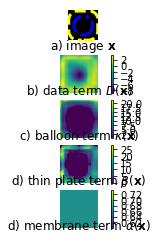

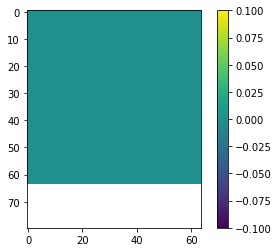

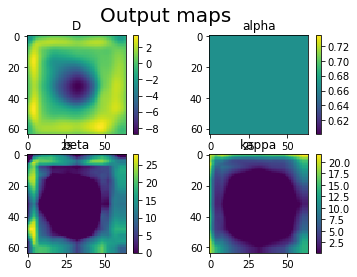

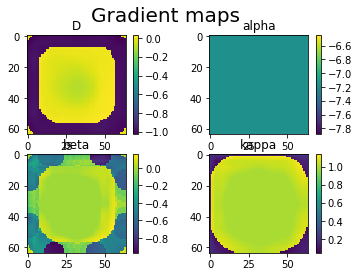

Train. Epoch 99. Iter 96/100, IoU = 0.09


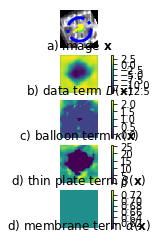

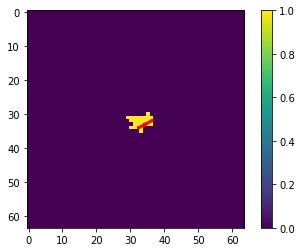

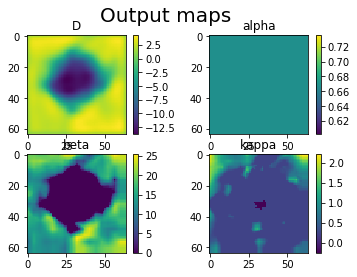

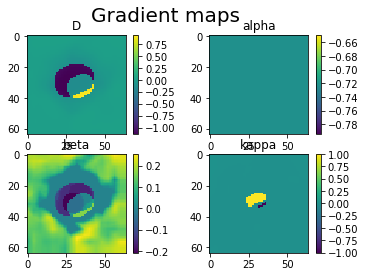

Train. Epoch 99. Iter 97/100, IoU = 0.09


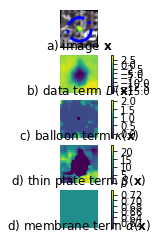

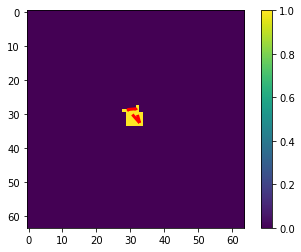

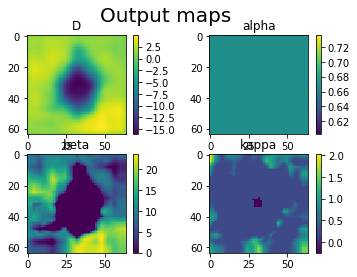

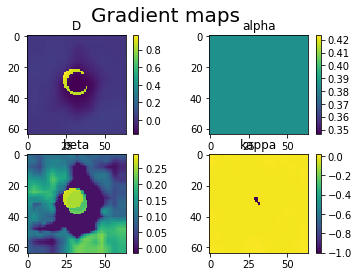

Train. Epoch 99. Iter 98/100, IoU = 0.09


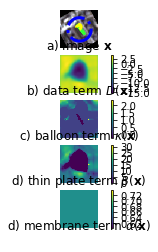

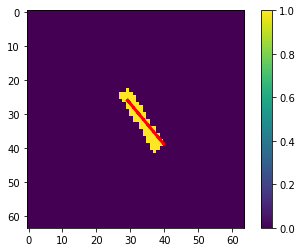

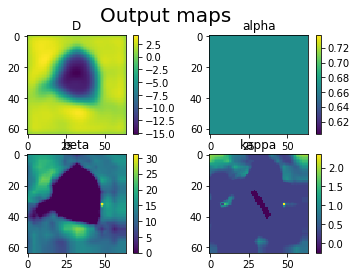

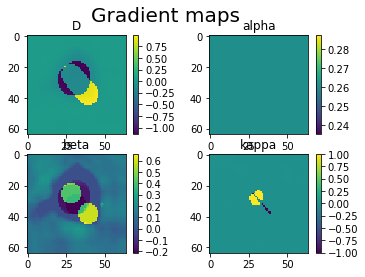

Train. Epoch 99. Iter 99/100, IoU = 0.09


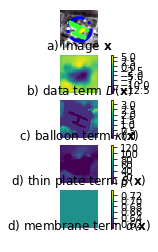

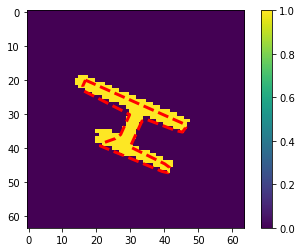

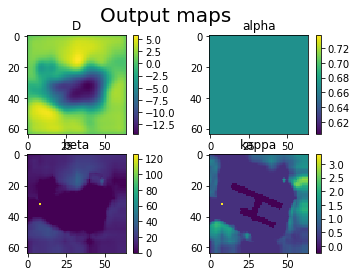

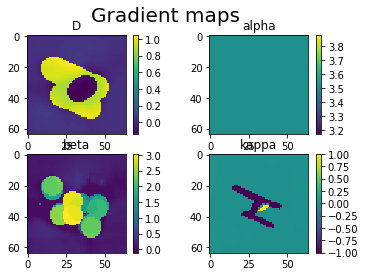

Train. Epoch 99. Iter 100/100, IoU = 0.08


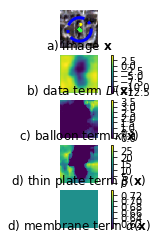

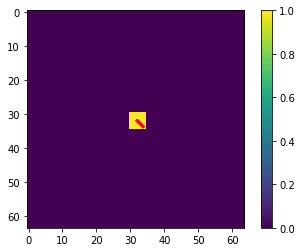

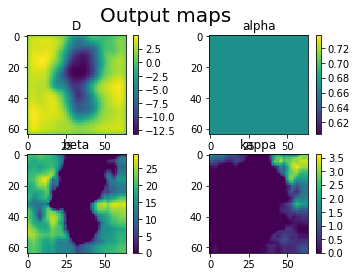

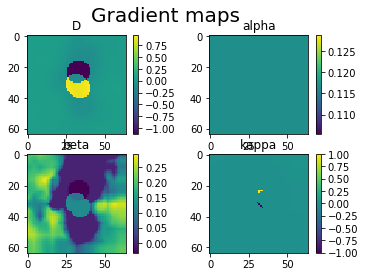

Test. Epoch 99. Iter 1/68, IoU = 0.00


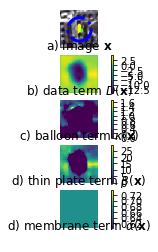

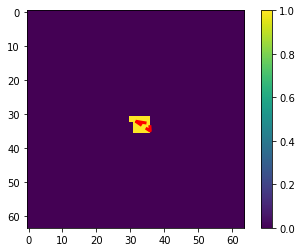

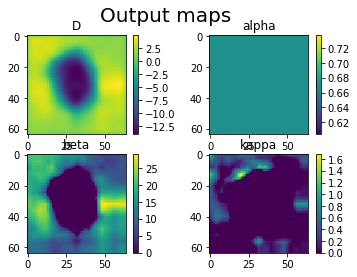

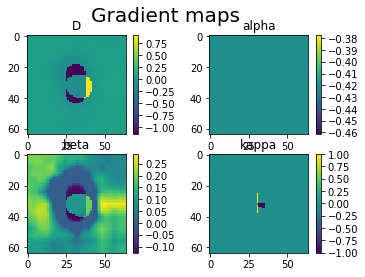

Test. Epoch 99. Iter 2/68, IoU = 0.02


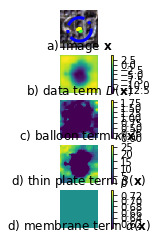

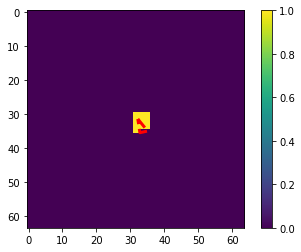

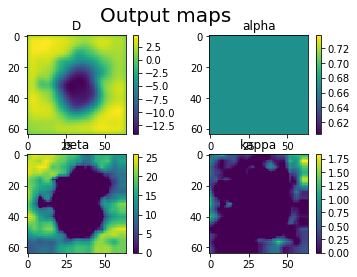

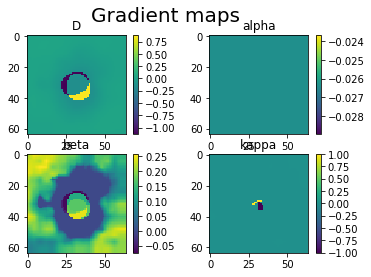

Test. Epoch 99. Iter 3/68, IoU = 0.01


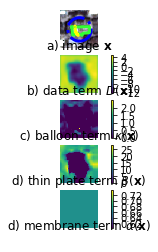

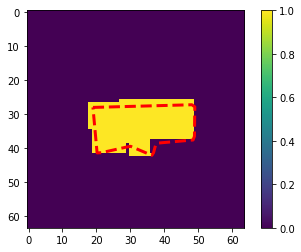

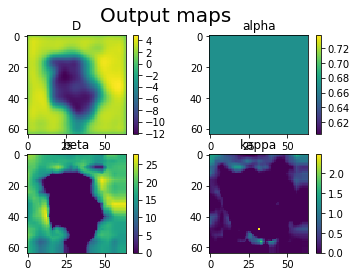

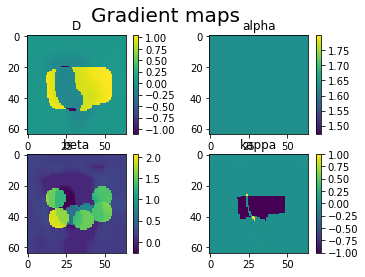

Test. Epoch 99. Iter 4/68, IoU = 0.02


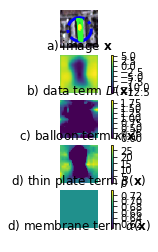

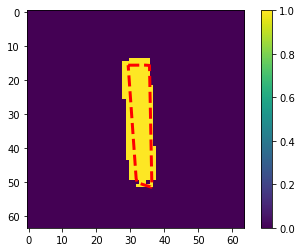

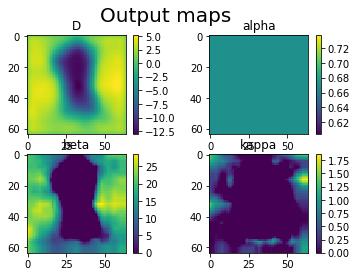

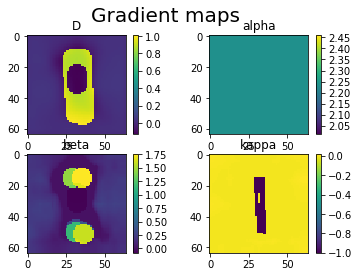

Test. Epoch 99. Iter 5/68, IoU = 0.02


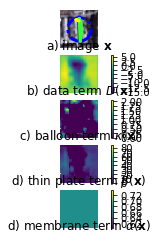

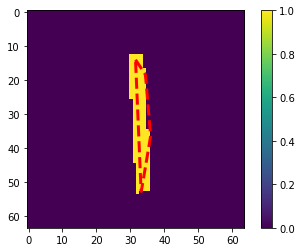

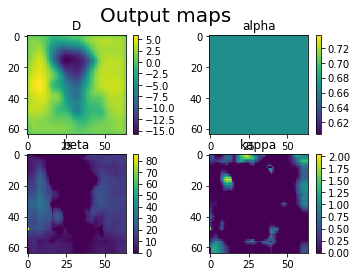

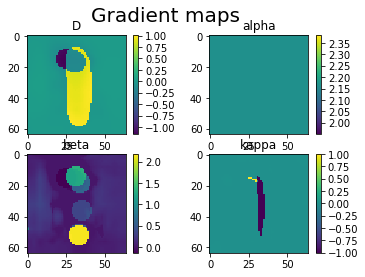

Test. Epoch 99. Iter 6/68, IoU = 0.02


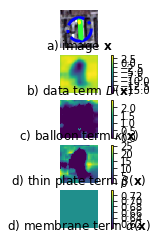

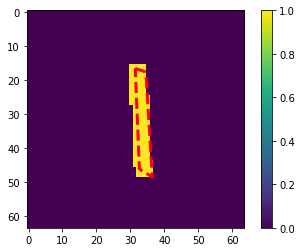

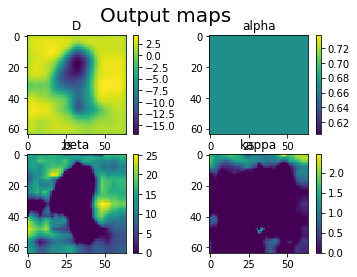

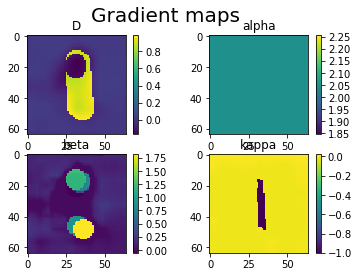

Test. Epoch 99. Iter 7/68, IoU = 0.02


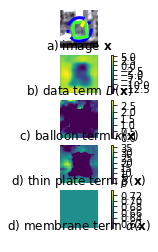

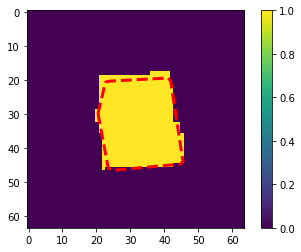

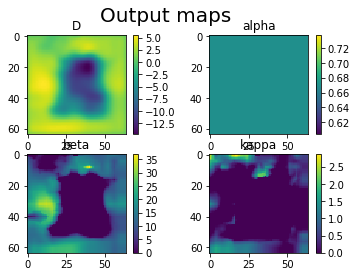

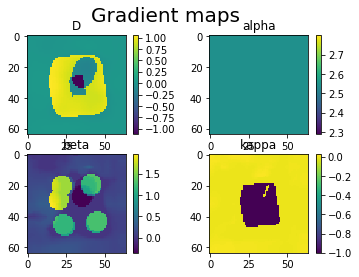

Test. Epoch 99. Iter 8/68, IoU = 0.02


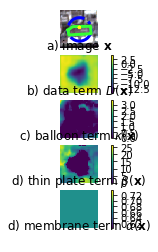

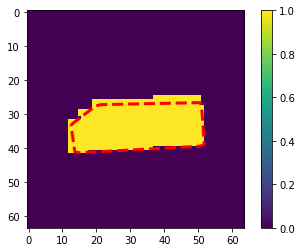

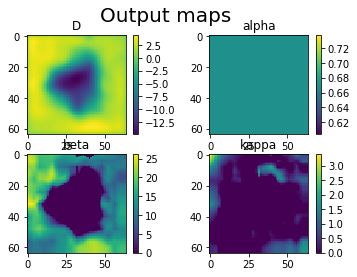

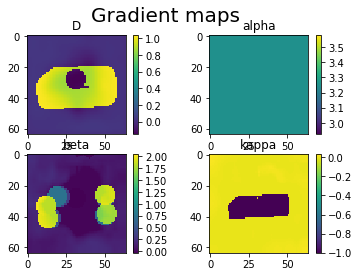

Test. Epoch 99. Iter 9/68, IoU = 0.02


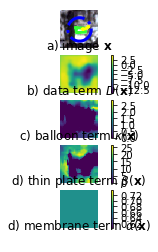

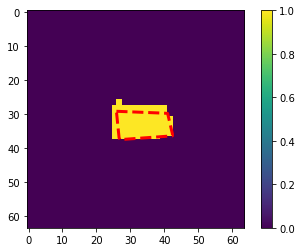

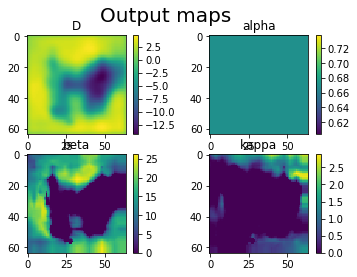

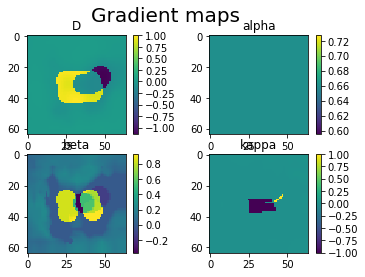

Test. Epoch 99. Iter 10/68, IoU = 0.02


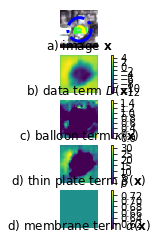

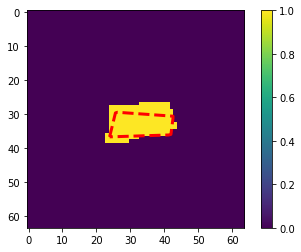

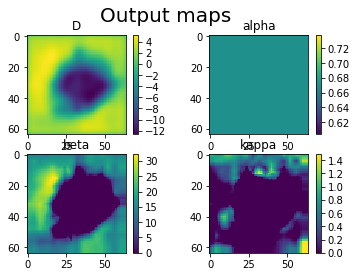

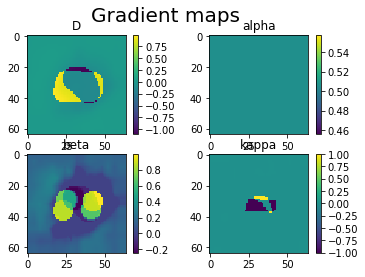

Test. Epoch 99. Iter 11/68, IoU = 0.04


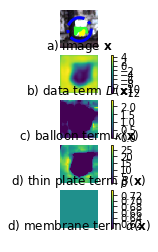

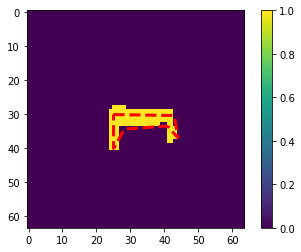

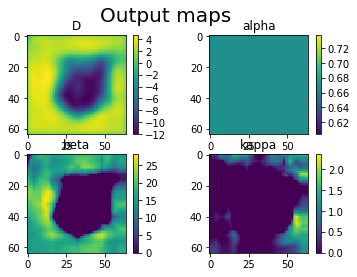

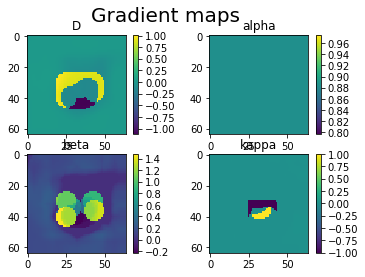

Test. Epoch 99. Iter 12/68, IoU = 0.04


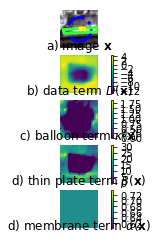

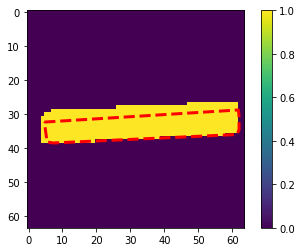

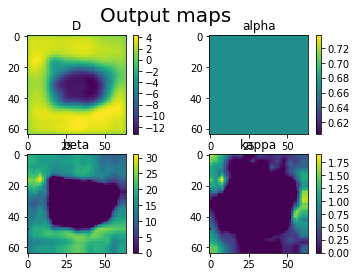

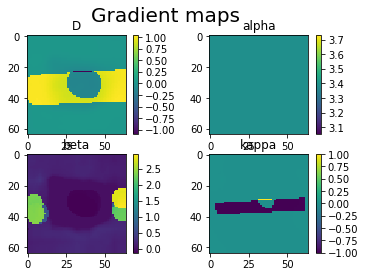

Test. Epoch 99. Iter 13/68, IoU = 0.04


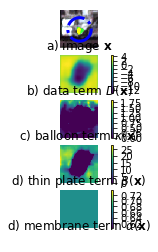

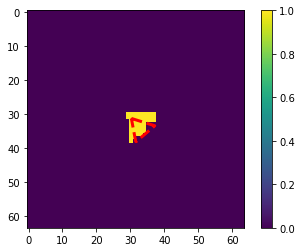

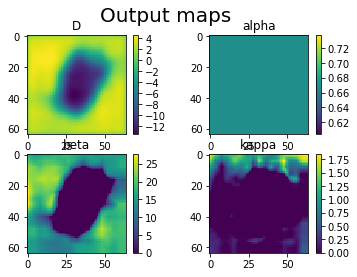

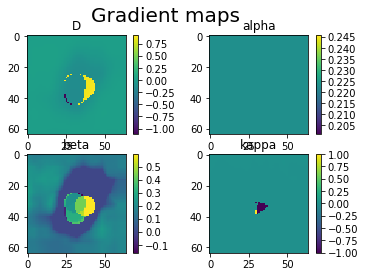

Test. Epoch 99. Iter 14/68, IoU = 0.05


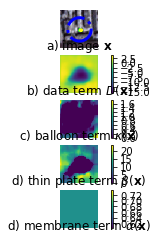

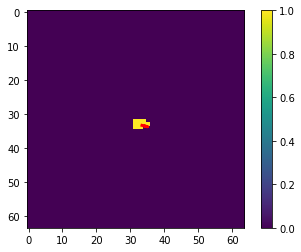

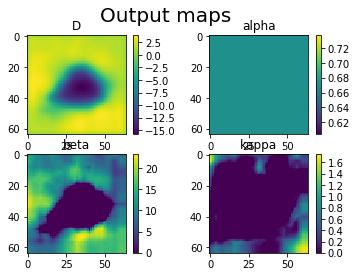

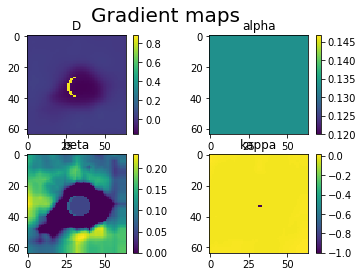

Test. Epoch 99. Iter 15/68, IoU = 0.07


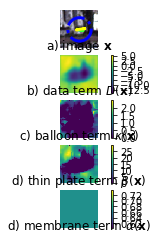

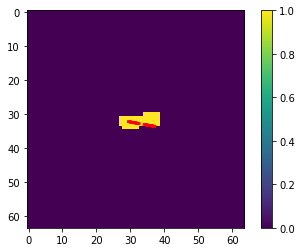

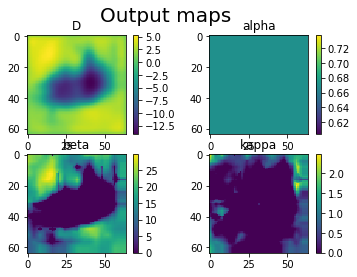

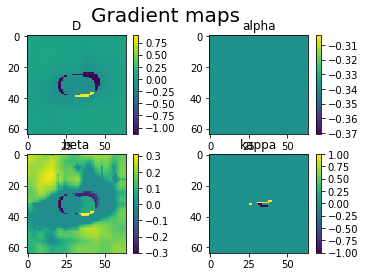

Test. Epoch 99. Iter 16/68, IoU = 0.07


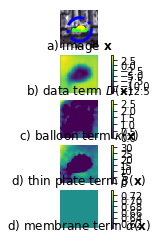

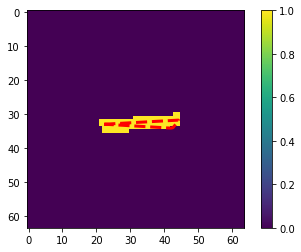

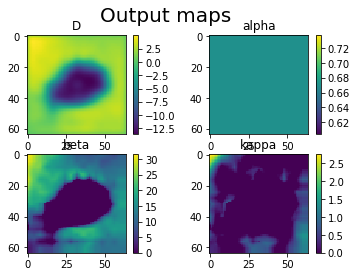

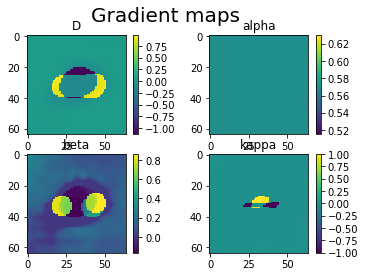

Test. Epoch 99. Iter 17/68, IoU = 0.08


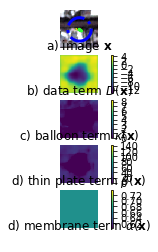

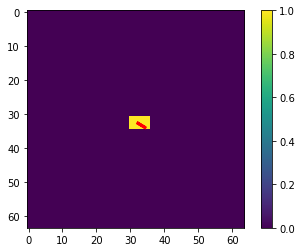

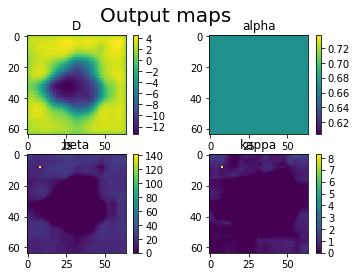

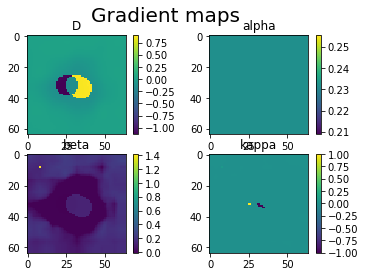

Test. Epoch 99. Iter 18/68, IoU = 0.07


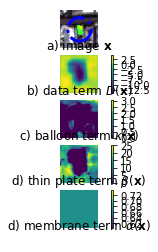

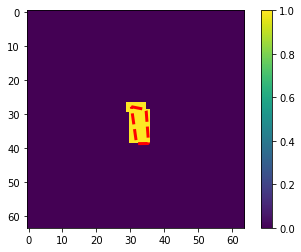

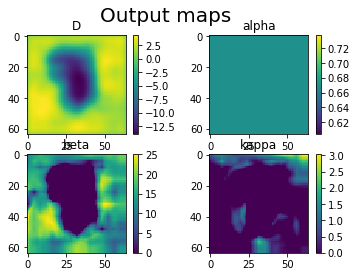

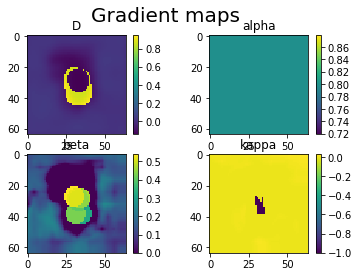

Test. Epoch 99. Iter 19/68, IoU = 0.07


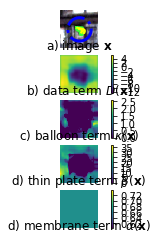

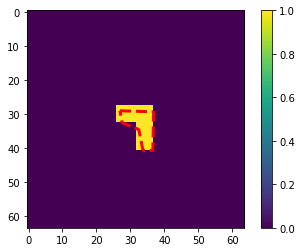

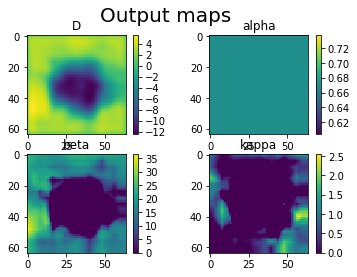

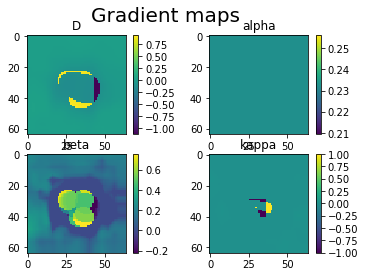

Test. Epoch 99. Iter 20/68, IoU = 0.09


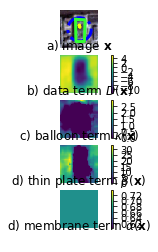

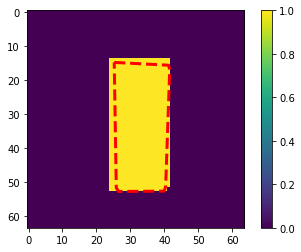

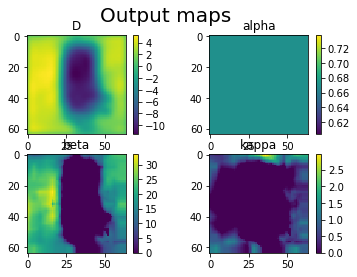

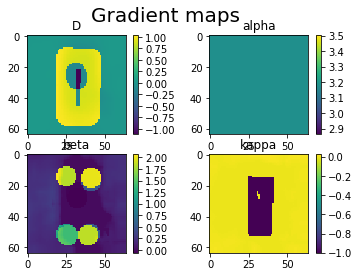

Test. Epoch 99. Iter 21/68, IoU = 0.09


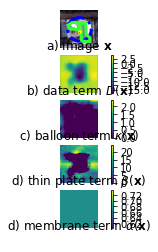

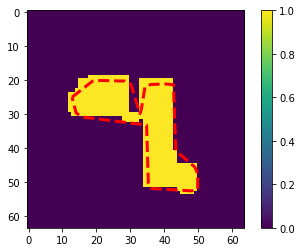

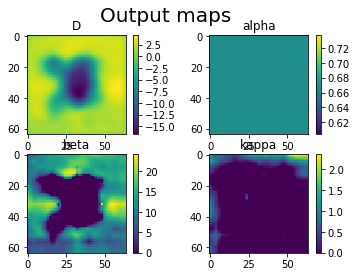

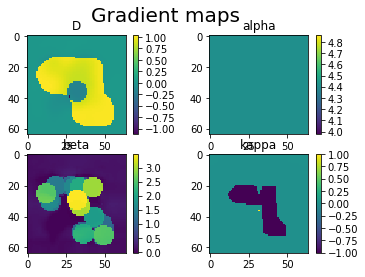

Test. Epoch 99. Iter 22/68, IoU = 0.09


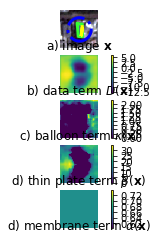

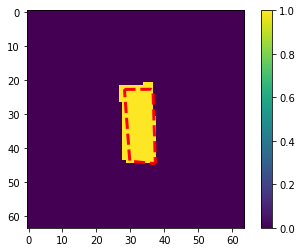

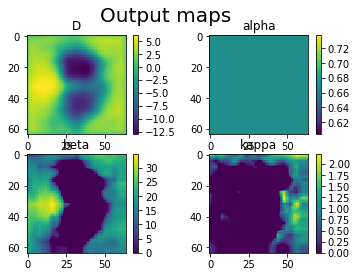

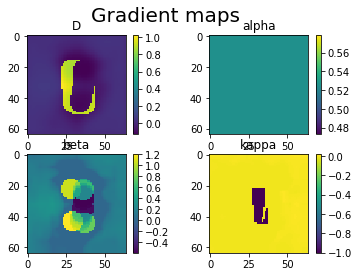

Test. Epoch 99. Iter 23/68, IoU = 0.09


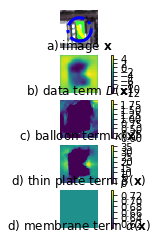

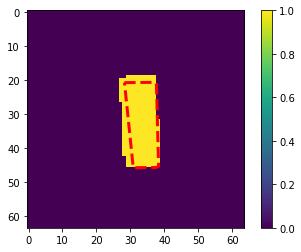

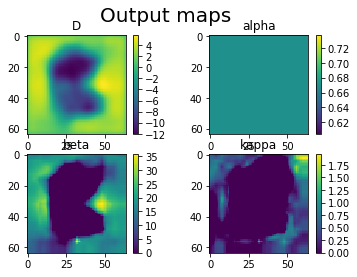

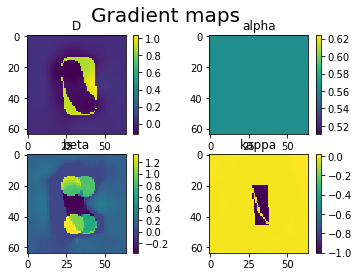

Test. Epoch 99. Iter 24/68, IoU = 0.09


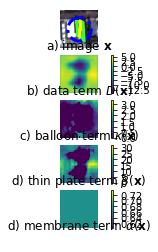

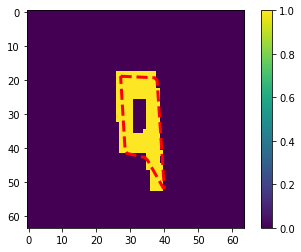

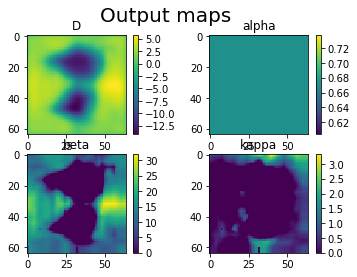

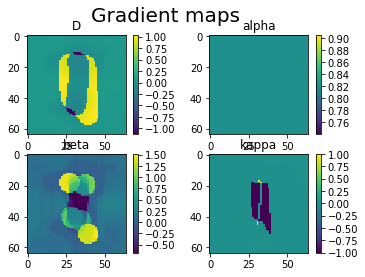

Test. Epoch 99. Iter 25/68, IoU = 0.09


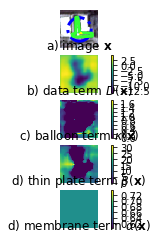

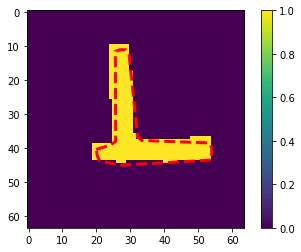

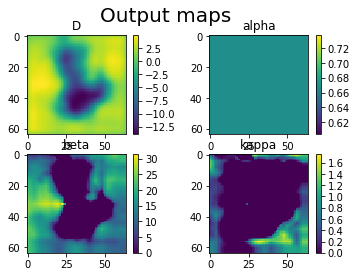

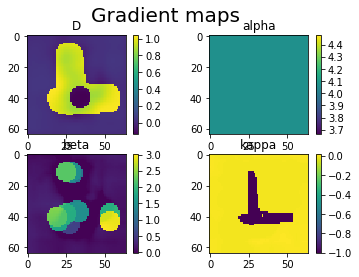

Test. Epoch 99. Iter 26/68, IoU = 0.09


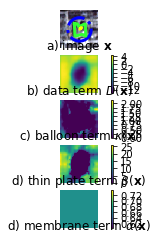

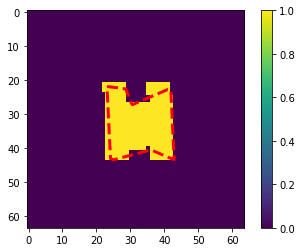

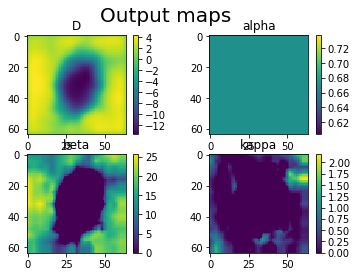

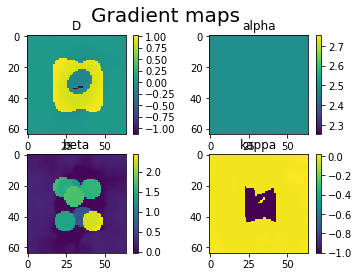

Test. Epoch 99. Iter 27/68, IoU = 0.08


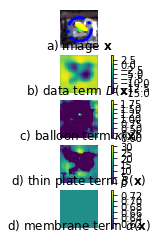

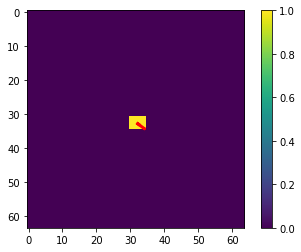

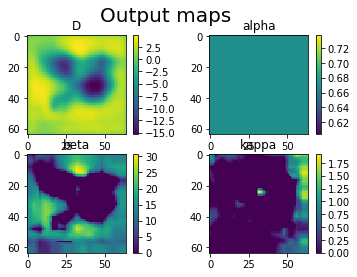

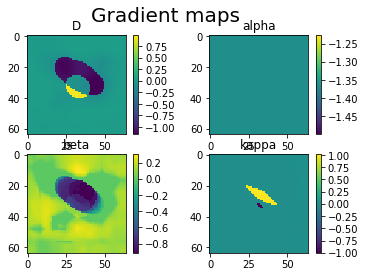

Test. Epoch 99. Iter 28/68, IoU = 0.08


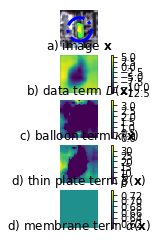

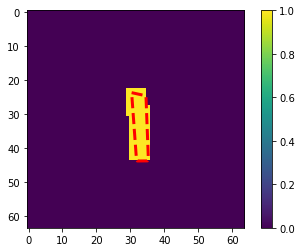

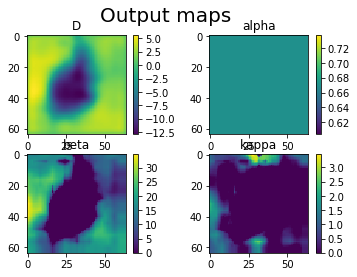

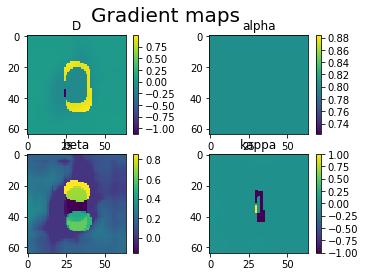

Test. Epoch 99. Iter 29/68, IoU = 0.08


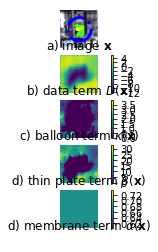

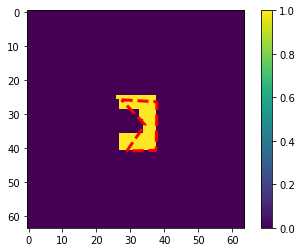

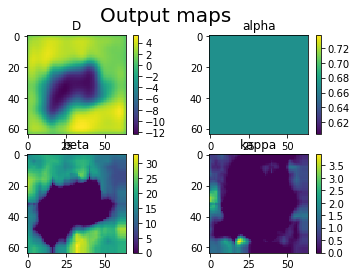

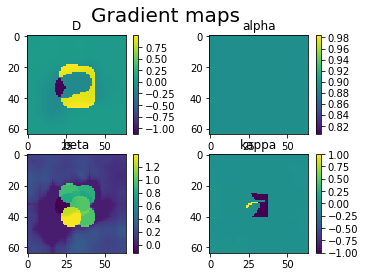

Test. Epoch 99. Iter 30/68, IoU = 0.08


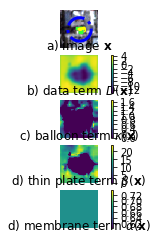

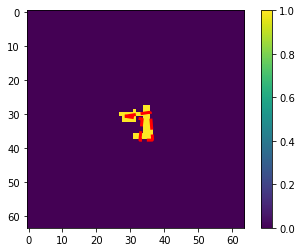

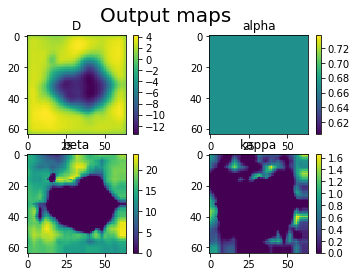

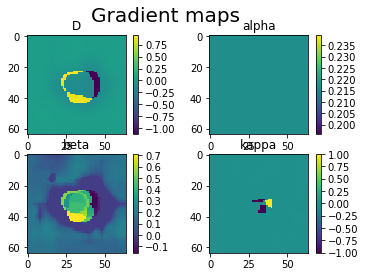

Test. Epoch 99. Iter 31/68, IoU = 0.09


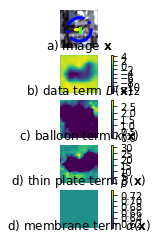

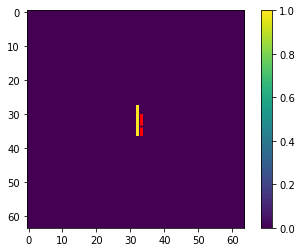

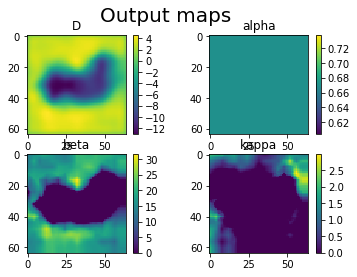

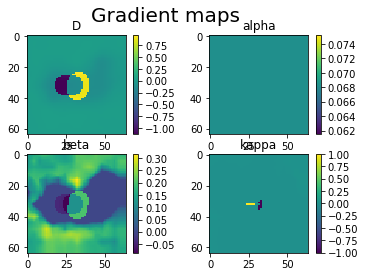

Test. Epoch 99. Iter 32/68, IoU = 0.08


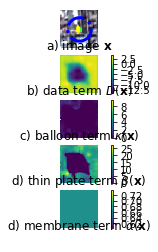

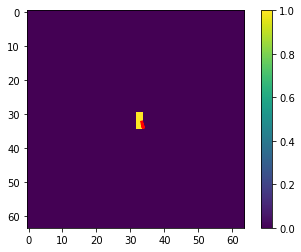

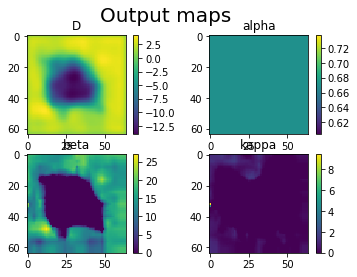

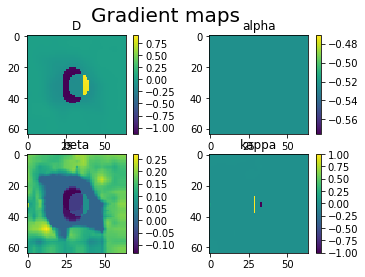

Test. Epoch 99. Iter 33/68, IoU = 0.08


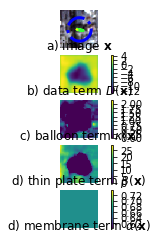

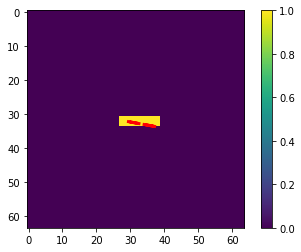

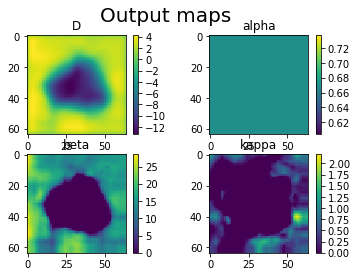

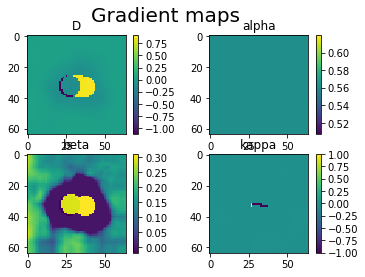

Test. Epoch 99. Iter 34/68, IoU = 0.08


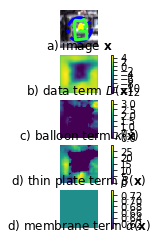

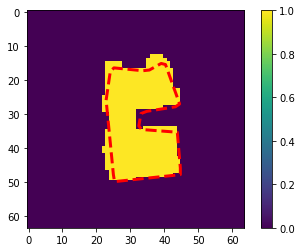

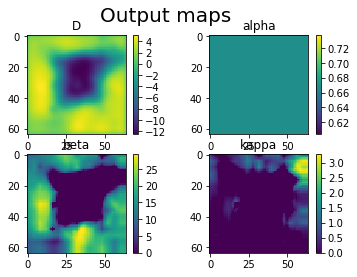

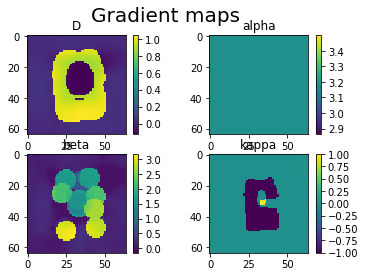

Test. Epoch 99. Iter 35/68, IoU = 0.08


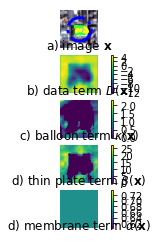

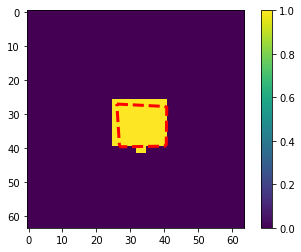

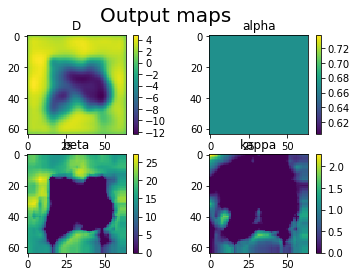

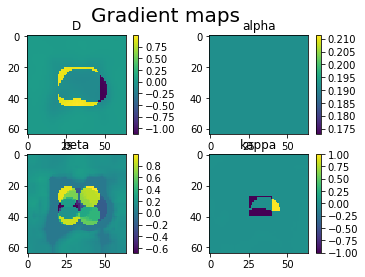

Test. Epoch 99. Iter 36/68, IoU = 0.09


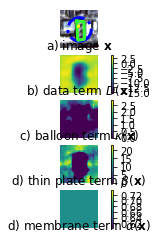

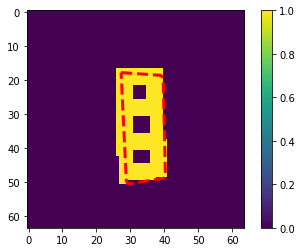

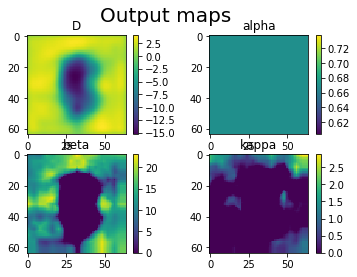

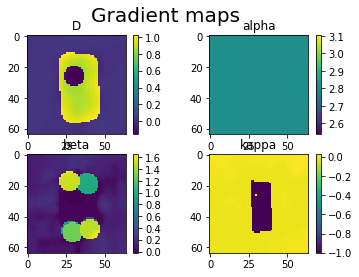

Test. Epoch 99. Iter 37/68, IoU = 0.08


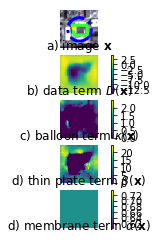

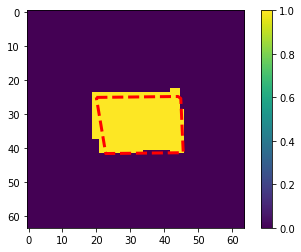

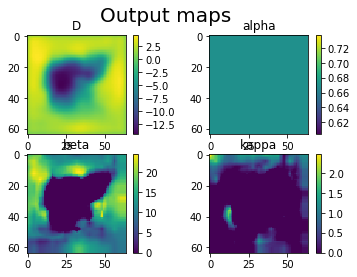

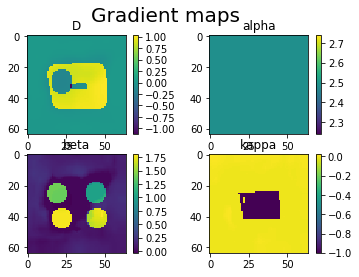

Test. Epoch 99. Iter 38/68, IoU = 0.08


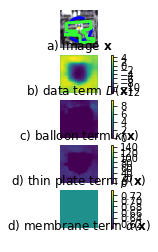

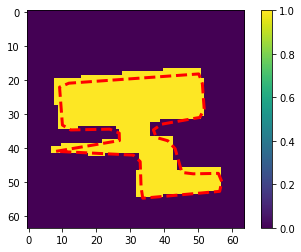

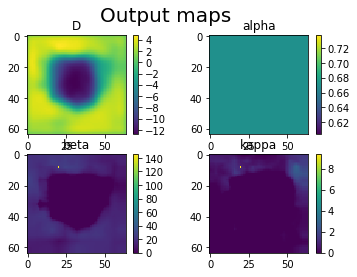

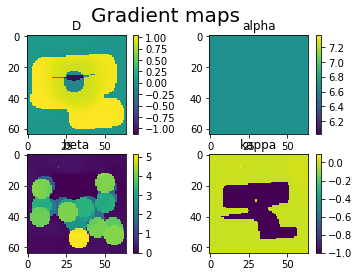

Test. Epoch 99. Iter 39/68, IoU = 0.08


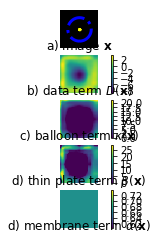

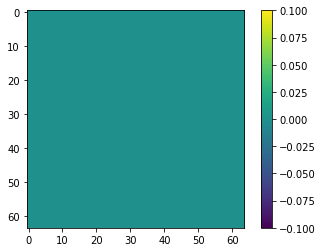

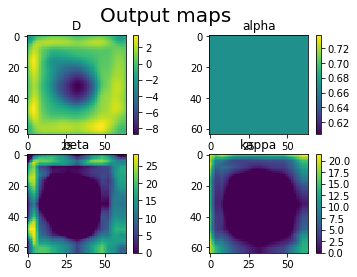

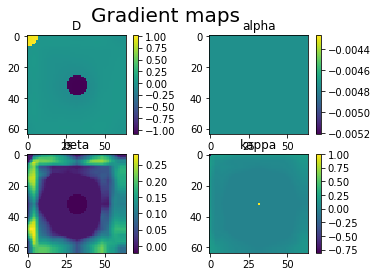

Test. Epoch 99. Iter 40/68, IoU = 0.08


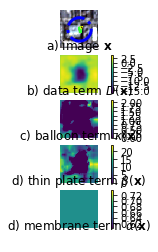

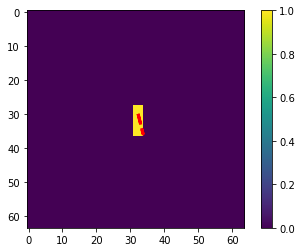

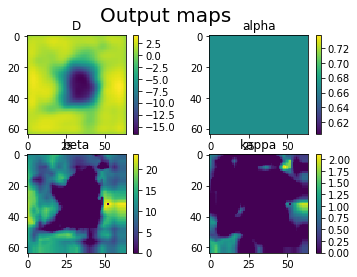

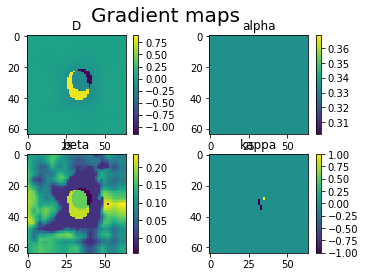

Test. Epoch 99. Iter 41/68, IoU = 0.08


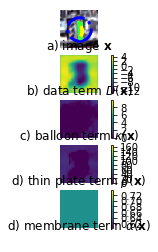

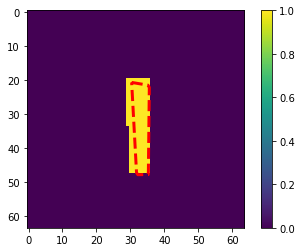

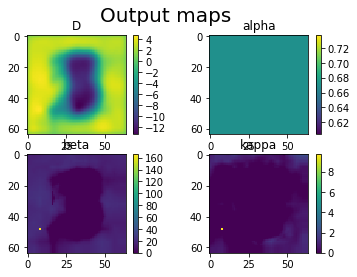

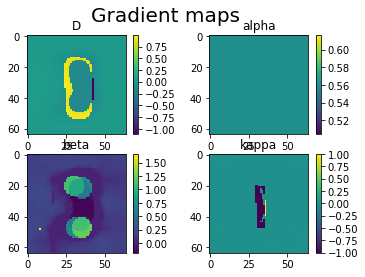

Test. Epoch 99. Iter 42/68, IoU = 0.08


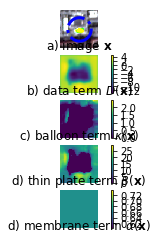

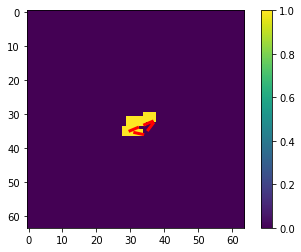

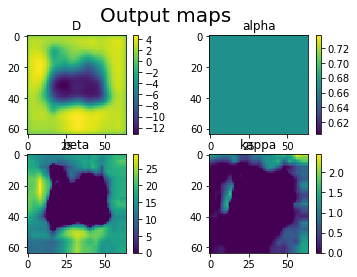

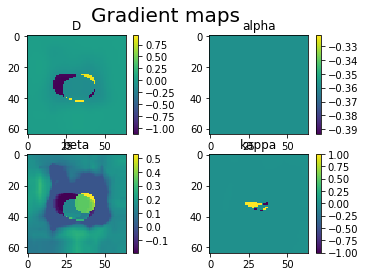

Test. Epoch 99. Iter 43/68, IoU = 0.08


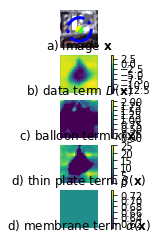

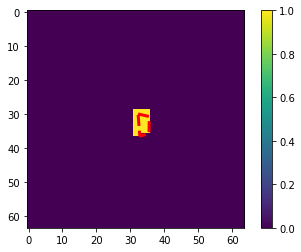

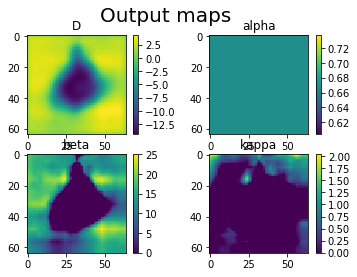

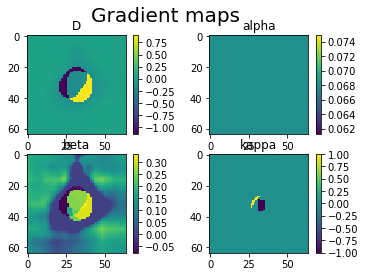

Test. Epoch 99. Iter 44/68, IoU = 0.08


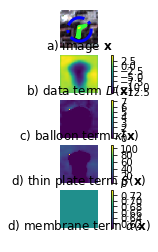

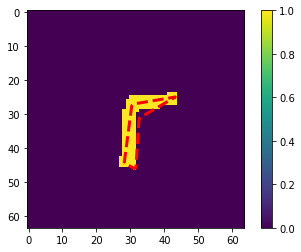

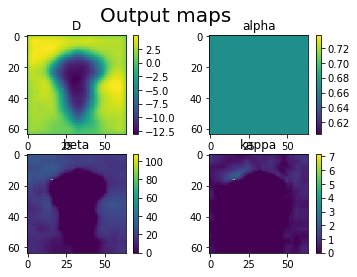

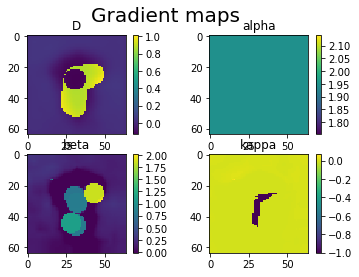

Test. Epoch 99. Iter 45/68, IoU = 0.08


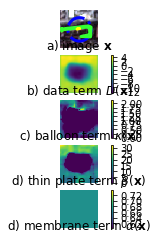

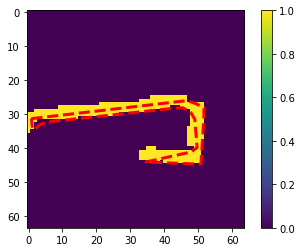

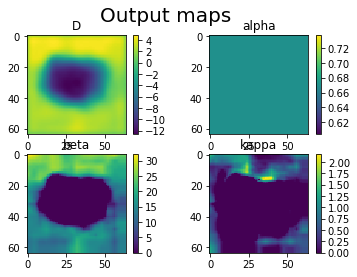

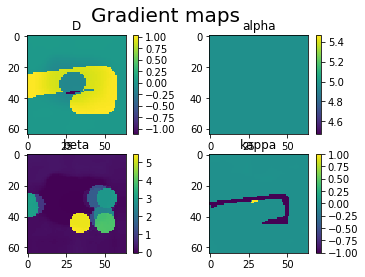

Test. Epoch 99. Iter 46/68, IoU = 0.08


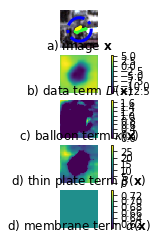

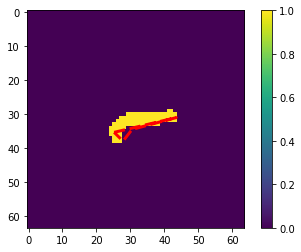

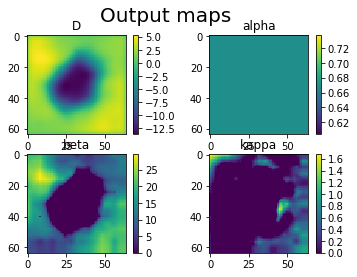

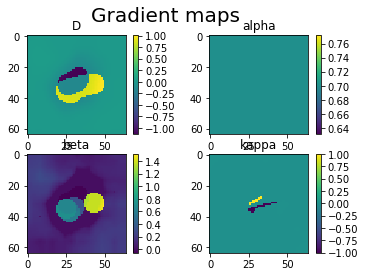

Test. Epoch 99. Iter 47/68, IoU = 0.08


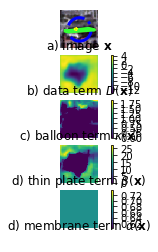

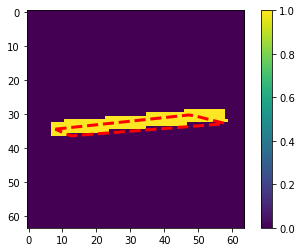

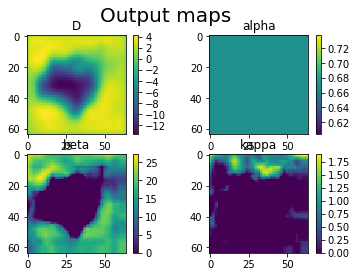

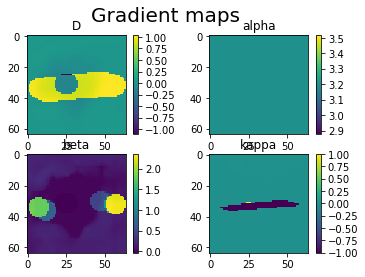

Test. Epoch 99. Iter 48/68, IoU = 0.08


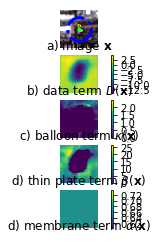

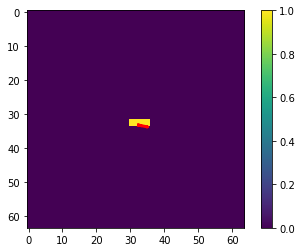

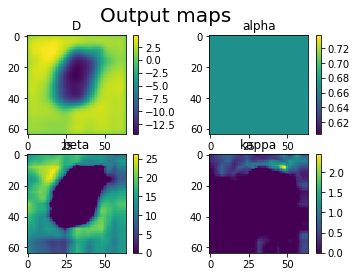

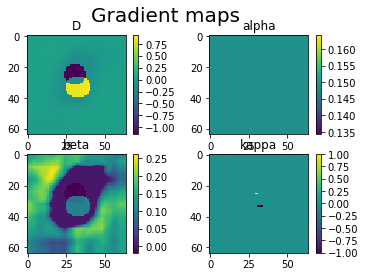

Test. Epoch 99. Iter 49/68, IoU = 0.07


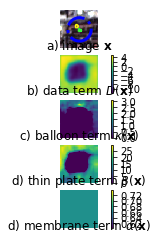

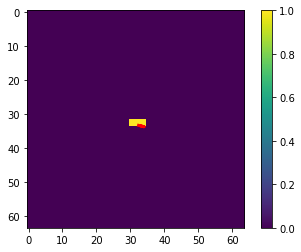

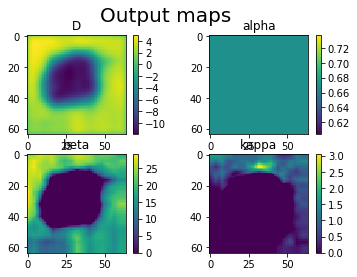

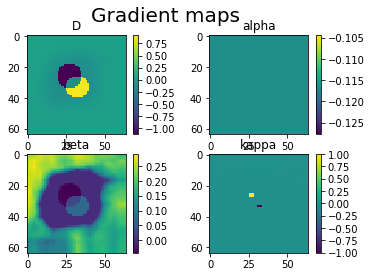

Test. Epoch 99. Iter 50/68, IoU = 0.07


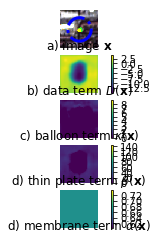

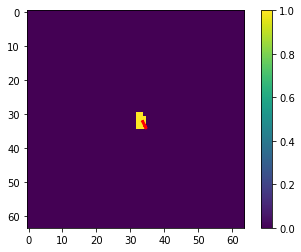

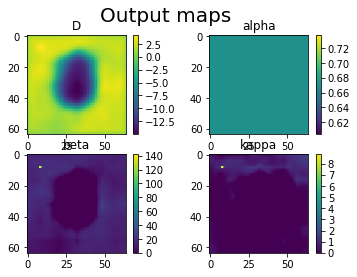

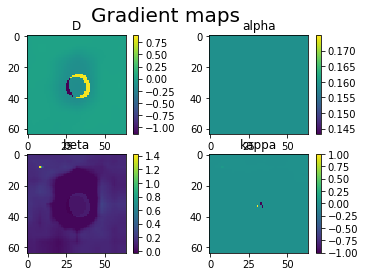

Test. Epoch 99. Iter 51/68, IoU = 0.07


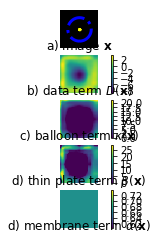

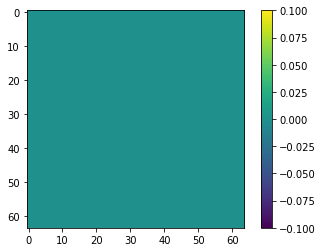

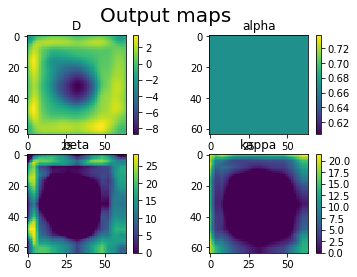

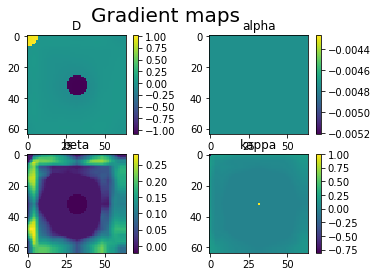

Test. Epoch 99. Iter 52/68, IoU = 0.07


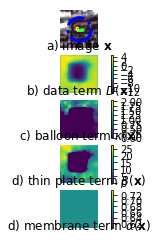

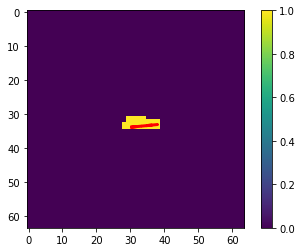

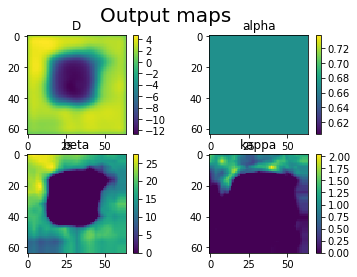

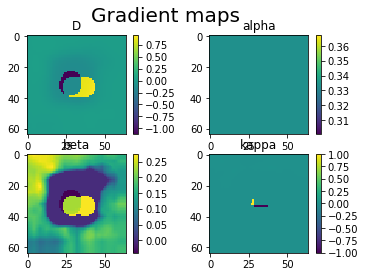

Test. Epoch 99. Iter 53/68, IoU = 0.07


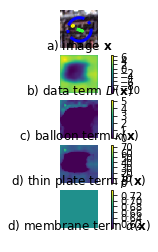

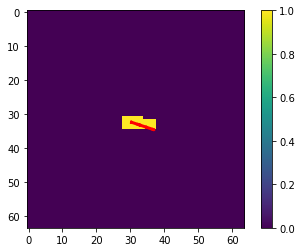

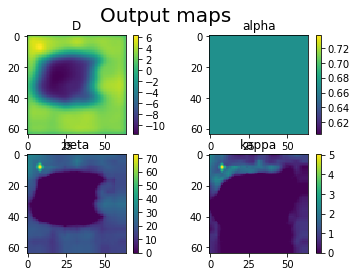

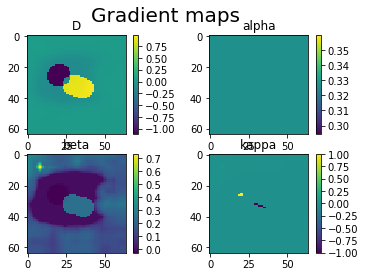

Test. Epoch 99. Iter 54/68, IoU = 0.07


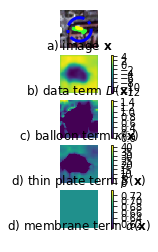

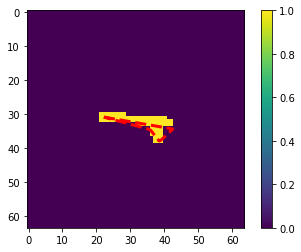

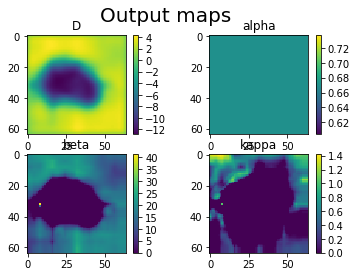

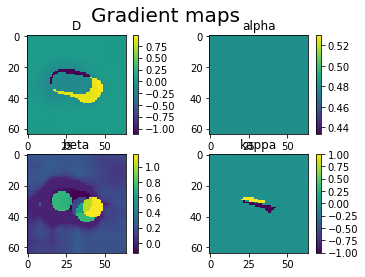

Test. Epoch 99. Iter 55/68, IoU = 0.07


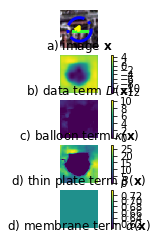

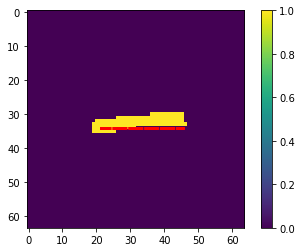

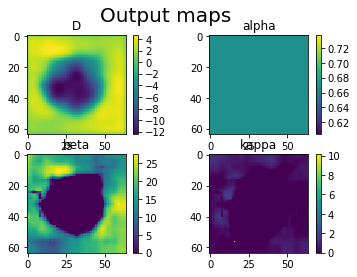

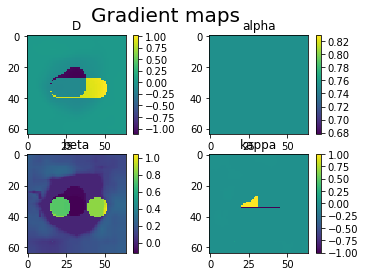

Test. Epoch 99. Iter 56/68, IoU = 0.06


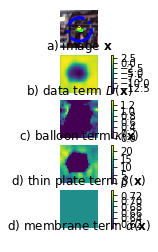

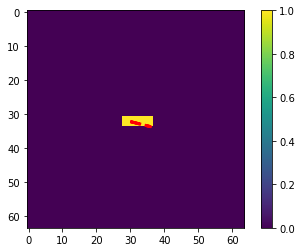

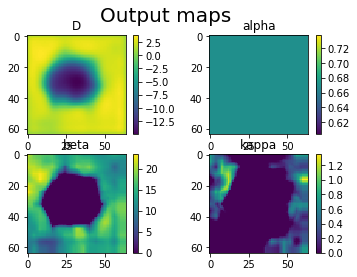

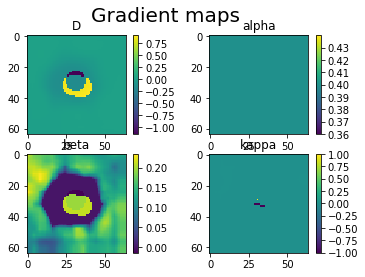

Test. Epoch 99. Iter 57/68, IoU = 0.06


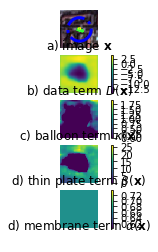

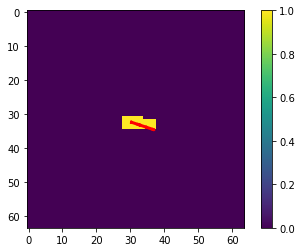

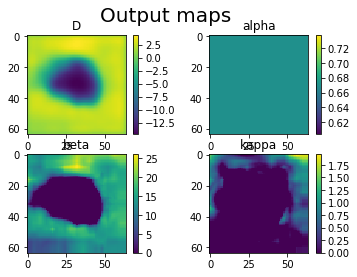

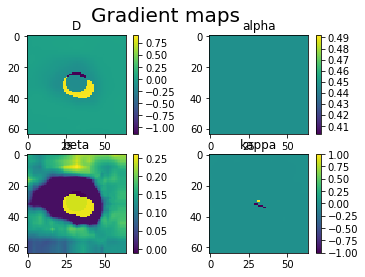

Test. Epoch 99. Iter 58/68, IoU = 0.06


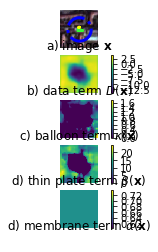

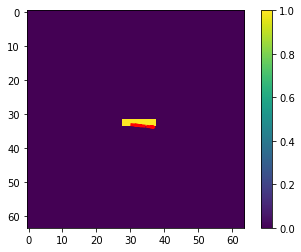

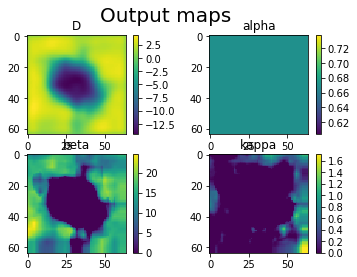

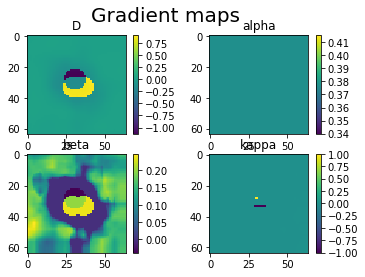

Test. Epoch 99. Iter 59/68, IoU = 0.06


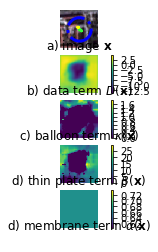

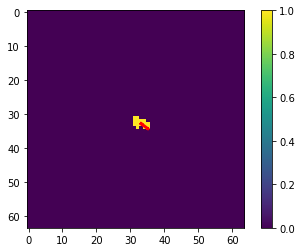

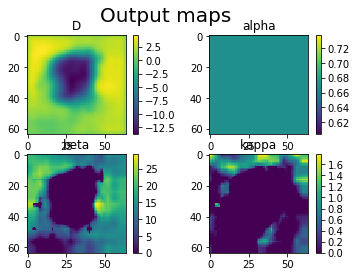

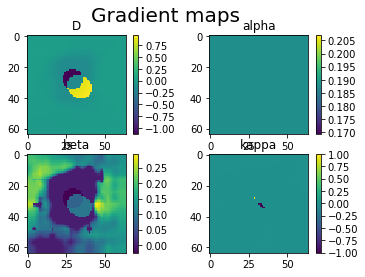

Test. Epoch 99. Iter 60/68, IoU = 0.06


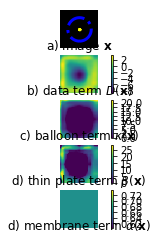

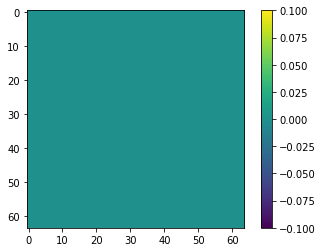

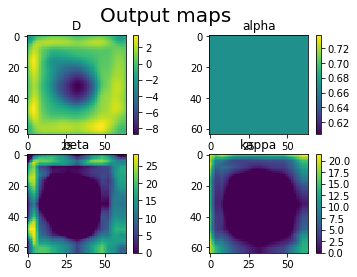

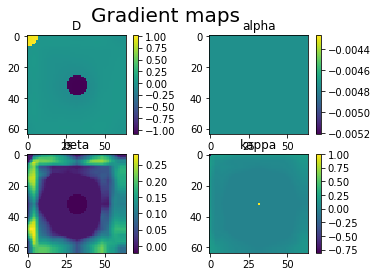

Test. Epoch 99. Iter 61/68, IoU = 0.06


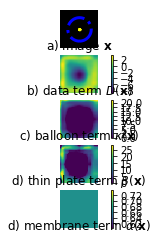

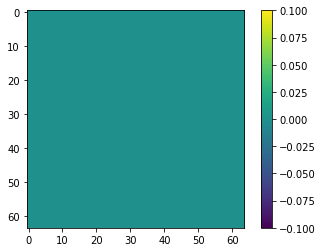

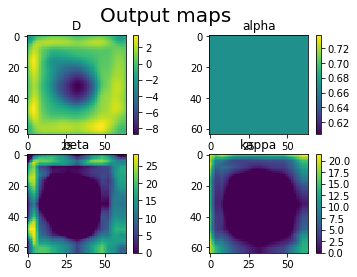

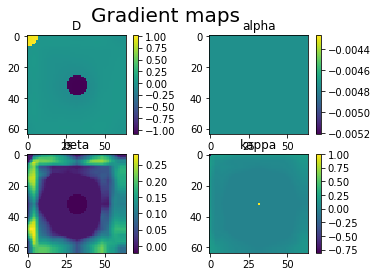

Test. Epoch 99. Iter 62/68, IoU = 0.06


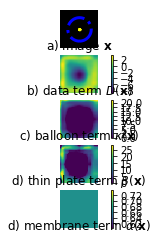

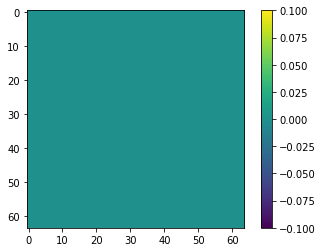

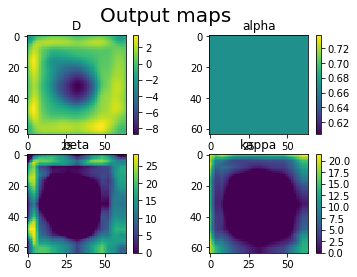

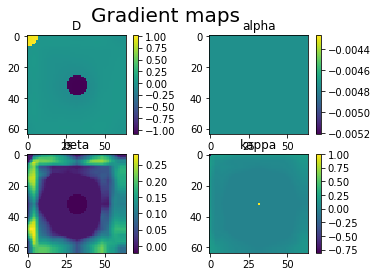

Test. Epoch 99. Iter 63/68, IoU = 0.06


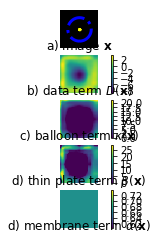

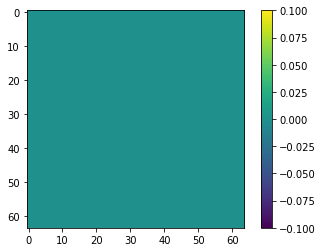

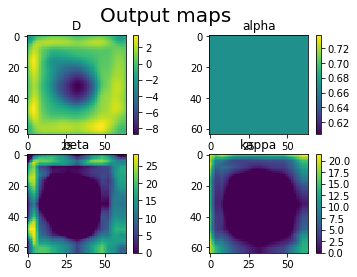

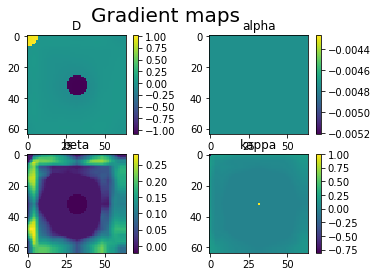

Test. Epoch 99. Iter 64/68, IoU = 0.06


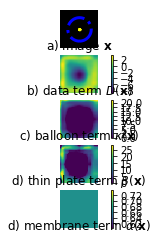

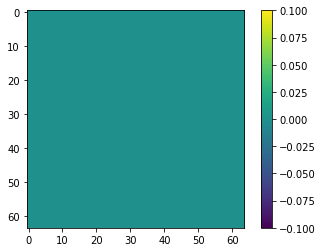

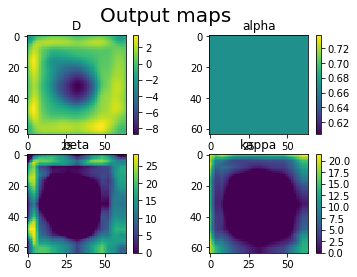

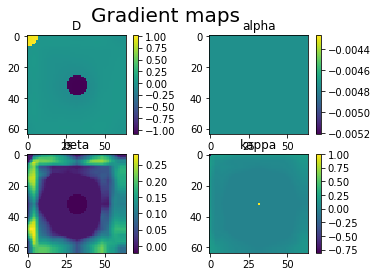

Test. Epoch 99. Iter 65/68, IoU = 0.06


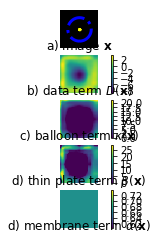

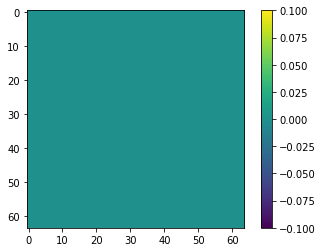

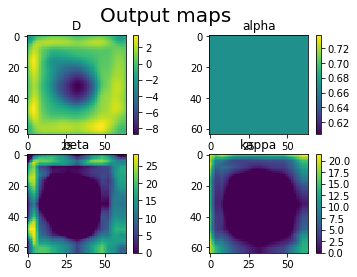

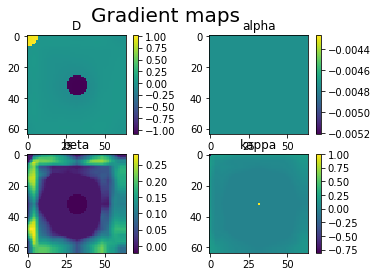

Test. Epoch 99. Iter 66/68, IoU = 0.05


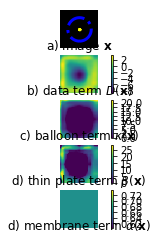

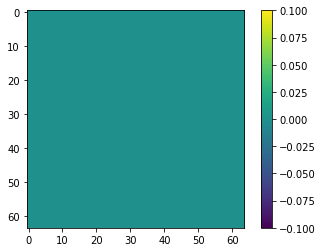

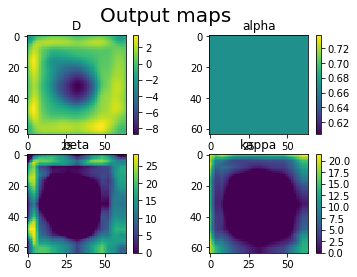

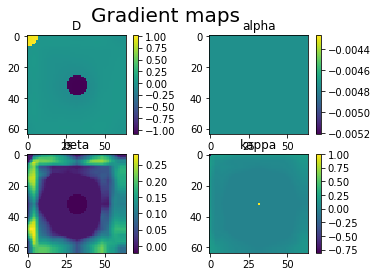

Test. Epoch 99. Iter 67/68, IoU = 0.05


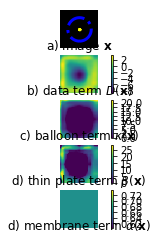

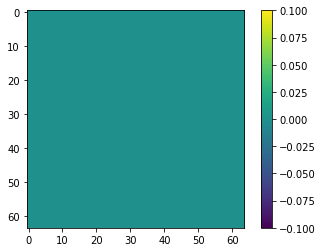

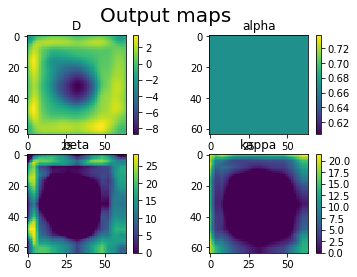

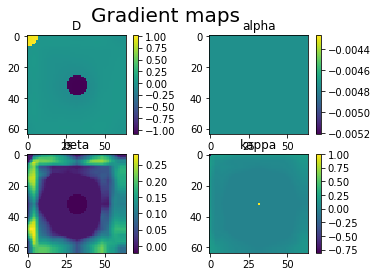

Test. Epoch 99. Iter 68/68, IoU = 0.05
CPU times: user 2h 2min 53s, sys: 24min 44s, total: 2h 27min 37s
Wall time: 1h 9min 57s


In [98]:
%%time

%run ./../src/dsac -i "./../dataset/planet_dsac/" -m "./../models/planet/" --do_plot "True"

In [105]:
saver.last_checkpoints

['/home/jovyan/work/DSAC/notebooks/../models/planet/model-95',
 '/home/jovyan/work/DSAC/notebooks/../models/planet/model-96',
 '/home/jovyan/work/DSAC/notebooks/../models/planet/model-97',
 '/home/jovyan/work/DSAC/notebooks/../models/planet/model-98',
 '/home/jovyan/work/DSAC/notebooks/../models/planet/model-99']

In [107]:
tf.

[]

import h5py
with h5py.File('model.hdf5', 'w') as f:
    for var in tf.trainable_variables():
        key = var.name.replace('/', ' ')
        value = session.run(var)
        f.create_dataset(key, data=value)

In [1]:
%%time

%run ./../src/dsac -i "./../dataset/instance/clipped_dataset/" -m "./../models/planetv3/" --do_plot "True"

Notebook Dir: /home/jovyan/work/DSAC/notebooks
Namespace(do_plot='True', do_train=True, inputdatapath='./../dataset/instance/clipped_dataset/', inputmodelpath='./../models/planetv3/', outputfilename=None, verbose=True)
Input data path: /home/jovyan/work/DSAC/notebooks/../dataset/instance/clipped_dataset/
Input model path: /home/jovyan/work/DSAC/notebooks/../models/planetv3/
Plot: True
Train: True
12 2 2
14 2 2
30 2 2
32 2 2
33 2 2
36 2 2
37 2 2
38 2 2
50 2 2
53 2 2
65 2 2
66 2 2
67 2 2
71 1 1
79 2 2
80 2 2
83 2 2
92 2 2
93 1 1
95 2 2
96 2 2
98 2 2
104 2 2
106 2 2
107 2 2
109 2 2
110 2 2
116 2 2
117 2 2
122 2 2
123 2 2
126 2 2
128 2 2
132 2 2
133 2 2
136 2 2
139 1 1
141 2 2
145 2 2
146 2 2
158 2 2
Creating CNN...








Creating snake inference graph...

Train. Epoch 0. Iter 1/100, IoU = 0.81
Train. Epoch 0. Iter 2/100, IoU = 0.56
Train. Epoch 0. Iter 3/100, IoU = 0.38
Train. Epoch 0. Iter 4/100, IoU = 0.28
Train. Epoch 0. Iter 5/100, IoU = 0.23
Train. Epoch 0. Iter 6/100, IoU = 0.19
T

<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Train. Epoch 99. Iter 1/100, IoU = 0.01


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Train. Epoch 99. Iter 2/100, IoU = 0.00


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Train. Epoch 99. Iter 3/100, IoU = 0.02


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Train. Epoch 99. Iter 4/100, IoU = 0.04


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Train. Epoch 99. Iter 5/100, IoU = 0.05


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Train. Epoch 99. Iter 6/100, IoU = 0.04


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Train. Epoch 99. Iter 7/100, IoU = 0.10


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Train. Epoch 99. Iter 8/100, IoU = 0.08


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Train. Epoch 99. Iter 9/100, IoU = 0.07


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Train. Epoch 99. Iter 10/100, IoU = 0.07


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Train. Epoch 99. Iter 11/100, IoU = 0.06


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Train. Epoch 99. Iter 12/100, IoU = 0.06


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Train. Epoch 99. Iter 13/100, IoU = 0.07


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Train. Epoch 99. Iter 14/100, IoU = 0.06


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Train. Epoch 99. Iter 15/100, IoU = 0.06


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Train. Epoch 99. Iter 16/100, IoU = 0.06


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Train. Epoch 99. Iter 17/100, IoU = 0.06


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Train. Epoch 99. Iter 18/100, IoU = 0.06


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Train. Epoch 99. Iter 19/100, IoU = 0.06


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Train. Epoch 99. Iter 20/100, IoU = 0.06


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Train. Epoch 99. Iter 21/100, IoU = 0.05


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Train. Epoch 99. Iter 22/100, IoU = 0.06


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Train. Epoch 99. Iter 23/100, IoU = 0.06


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Train. Epoch 99. Iter 24/100, IoU = 0.06


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Train. Epoch 99. Iter 25/100, IoU = 0.06


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Train. Epoch 99. Iter 26/100, IoU = 0.06


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Train. Epoch 99. Iter 27/100, IoU = 0.06


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Train. Epoch 99. Iter 28/100, IoU = 0.06


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Train. Epoch 99. Iter 29/100, IoU = 0.06


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Train. Epoch 99. Iter 30/100, IoU = 0.05


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Train. Epoch 99. Iter 31/100, IoU = 0.05


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Train. Epoch 99. Iter 32/100, IoU = 0.05


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Train. Epoch 99. Iter 33/100, IoU = 0.05


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Train. Epoch 99. Iter 34/100, IoU = 0.05


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Train. Epoch 99. Iter 35/100, IoU = 0.05


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Train. Epoch 99. Iter 36/100, IoU = 0.05


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Train. Epoch 99. Iter 37/100, IoU = 0.04


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Train. Epoch 99. Iter 38/100, IoU = 0.04


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Train. Epoch 99. Iter 39/100, IoU = 0.04


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Train. Epoch 99. Iter 40/100, IoU = 0.04


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Train. Epoch 99. Iter 41/100, IoU = 0.04


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Train. Epoch 99. Iter 42/100, IoU = 0.04


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Train. Epoch 99. Iter 43/100, IoU = 0.05


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Train. Epoch 99. Iter 44/100, IoU = 0.05


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Train. Epoch 99. Iter 45/100, IoU = 0.05


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Train. Epoch 99. Iter 46/100, IoU = 0.05


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Train. Epoch 99. Iter 47/100, IoU = 0.04


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Train. Epoch 99. Iter 48/100, IoU = 0.04


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Train. Epoch 99. Iter 49/100, IoU = 0.04


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Train. Epoch 99. Iter 50/100, IoU = 0.04


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Train. Epoch 99. Iter 51/100, IoU = 0.04


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Train. Epoch 99. Iter 52/100, IoU = 0.04


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Train. Epoch 99. Iter 53/100, IoU = 0.04


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Train. Epoch 99. Iter 54/100, IoU = 0.05


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Train. Epoch 99. Iter 55/100, IoU = 0.05


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Train. Epoch 99. Iter 56/100, IoU = 0.04


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Train. Epoch 99. Iter 57/100, IoU = 0.04


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Train. Epoch 99. Iter 58/100, IoU = 0.04


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Train. Epoch 99. Iter 59/100, IoU = 0.04


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Train. Epoch 99. Iter 60/100, IoU = 0.04


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Train. Epoch 99. Iter 61/100, IoU = 0.04


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Train. Epoch 99. Iter 62/100, IoU = 0.04


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Train. Epoch 99. Iter 63/100, IoU = 0.04


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Train. Epoch 99. Iter 64/100, IoU = 0.04


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Train. Epoch 99. Iter 65/100, IoU = 0.04


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Train. Epoch 99. Iter 66/100, IoU = 0.04


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Train. Epoch 99. Iter 67/100, IoU = 0.04


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Train. Epoch 99. Iter 68/100, IoU = 0.04


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Train. Epoch 99. Iter 69/100, IoU = 0.04


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Train. Epoch 99. Iter 70/100, IoU = 0.04


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Train. Epoch 99. Iter 71/100, IoU = 0.04


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Train. Epoch 99. Iter 72/100, IoU = 0.04


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Train. Epoch 99. Iter 73/100, IoU = 0.04


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Train. Epoch 99. Iter 74/100, IoU = 0.04


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Train. Epoch 99. Iter 75/100, IoU = 0.04


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Train. Epoch 99. Iter 76/100, IoU = 0.04


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Train. Epoch 99. Iter 77/100, IoU = 0.04


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Train. Epoch 99. Iter 78/100, IoU = 0.04


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Train. Epoch 99. Iter 79/100, IoU = 0.04


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Train. Epoch 99. Iter 80/100, IoU = 0.04


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Train. Epoch 99. Iter 81/100, IoU = 0.04


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Train. Epoch 99. Iter 82/100, IoU = 0.04


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Train. Epoch 99. Iter 83/100, IoU = 0.04


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Train. Epoch 99. Iter 84/100, IoU = 0.04


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Train. Epoch 99. Iter 85/100, IoU = 0.04


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Train. Epoch 99. Iter 86/100, IoU = 0.04


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Train. Epoch 99. Iter 87/100, IoU = 0.04


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Train. Epoch 99. Iter 88/100, IoU = 0.04


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Train. Epoch 99. Iter 89/100, IoU = 0.04


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Train. Epoch 99. Iter 90/100, IoU = 0.04


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Train. Epoch 99. Iter 91/100, IoU = 0.04


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Train. Epoch 99. Iter 92/100, IoU = 0.04


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Train. Epoch 99. Iter 93/100, IoU = 0.04


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Train. Epoch 99. Iter 94/100, IoU = 0.04


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Train. Epoch 99. Iter 95/100, IoU = 0.04


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Train. Epoch 99. Iter 96/100, IoU = 0.04


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Train. Epoch 99. Iter 97/100, IoU = 0.04


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Train. Epoch 99. Iter 98/100, IoU = 0.04


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Train. Epoch 99. Iter 99/100, IoU = 0.04


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Train. Epoch 99. Iter 100/100, IoU = 0.04


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Test. Epoch 99. Iter 1/68, IoU = 0.10


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Test. Epoch 99. Iter 2/68, IoU = 0.05


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Test. Epoch 99. Iter 3/68, IoU = 0.03


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Test. Epoch 99. Iter 4/68, IoU = 0.03


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Test. Epoch 99. Iter 5/68, IoU = 0.02


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Test. Epoch 99. Iter 6/68, IoU = 0.02


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Test. Epoch 99. Iter 7/68, IoU = 0.01


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Test. Epoch 99. Iter 8/68, IoU = 0.01


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Test. Epoch 99. Iter 9/68, IoU = 0.01


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Test. Epoch 99. Iter 10/68, IoU = 0.01


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Test. Epoch 99. Iter 11/68, IoU = 0.03


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Test. Epoch 99. Iter 12/68, IoU = 0.03


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Test. Epoch 99. Iter 13/68, IoU = 0.03


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Test. Epoch 99. Iter 14/68, IoU = 0.03


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Test. Epoch 99. Iter 15/68, IoU = 0.02


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Test. Epoch 99. Iter 16/68, IoU = 0.02


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Test. Epoch 99. Iter 17/68, IoU = 0.02


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Test. Epoch 99. Iter 18/68, IoU = 0.02


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Test. Epoch 99. Iter 19/68, IoU = 0.02


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Test. Epoch 99. Iter 20/68, IoU = 0.02


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Test. Epoch 99. Iter 21/68, IoU = 0.02


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Test. Epoch 99. Iter 22/68, IoU = 0.02


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Test. Epoch 99. Iter 23/68, IoU = 0.02


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Test. Epoch 99. Iter 24/68, IoU = 0.01


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Test. Epoch 99. Iter 25/68, IoU = 0.03


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Test. Epoch 99. Iter 26/68, IoU = 0.03


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Test. Epoch 99. Iter 27/68, IoU = 0.03


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Test. Epoch 99. Iter 28/68, IoU = 0.02


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Test. Epoch 99. Iter 29/68, IoU = 0.02


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Test. Epoch 99. Iter 30/68, IoU = 0.02


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Test. Epoch 99. Iter 31/68, IoU = 0.02


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Test. Epoch 99. Iter 32/68, IoU = 0.02


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Test. Epoch 99. Iter 33/68, IoU = 0.02


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Test. Epoch 99. Iter 34/68, IoU = 0.02


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Test. Epoch 99. Iter 35/68, IoU = 0.02


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Test. Epoch 99. Iter 36/68, IoU = 0.02


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Test. Epoch 99. Iter 37/68, IoU = 0.02


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Test. Epoch 99. Iter 38/68, IoU = 0.02


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Test. Epoch 99. Iter 39/68, IoU = 0.02


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Test. Epoch 99. Iter 40/68, IoU = 0.02


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Test. Epoch 99. Iter 41/68, IoU = 0.02


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Test. Epoch 99. Iter 42/68, IoU = 0.02


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Test. Epoch 99. Iter 43/68, IoU = 0.02


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Test. Epoch 99. Iter 44/68, IoU = 0.02


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Test. Epoch 99. Iter 45/68, IoU = 0.02


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Test. Epoch 99. Iter 46/68, IoU = 0.02


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Test. Epoch 99. Iter 47/68, IoU = 0.02


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Test. Epoch 99. Iter 48/68, IoU = 0.02


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Test. Epoch 99. Iter 49/68, IoU = 0.02


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Test. Epoch 99. Iter 50/68, IoU = 0.02


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Test. Epoch 99. Iter 51/68, IoU = 0.02


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Test. Epoch 99. Iter 52/68, IoU = 0.02


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Test. Epoch 99. Iter 53/68, IoU = 0.02


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Test. Epoch 99. Iter 54/68, IoU = 0.02


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Test. Epoch 99. Iter 55/68, IoU = 0.02


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Test. Epoch 99. Iter 56/68, IoU = 0.02


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Test. Epoch 99. Iter 57/68, IoU = 0.02


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Test. Epoch 99. Iter 58/68, IoU = 0.02


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Test. Epoch 99. Iter 59/68, IoU = 0.02


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Test. Epoch 99. Iter 60/68, IoU = 0.02


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Test. Epoch 99. Iter 61/68, IoU = 0.02


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Test. Epoch 99. Iter 62/68, IoU = 0.02


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Test. Epoch 99. Iter 63/68, IoU = 0.02


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Test. Epoch 99. Iter 64/68, IoU = 0.02


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Test. Epoch 99. Iter 65/68, IoU = 0.02


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Test. Epoch 99. Iter 66/68, IoU = 0.02


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Test. Epoch 99. Iter 67/68, IoU = 0.02


<Figure size 640x480 with 9 Axes>

<Figure size 640x480 with 2 Axes>

<Figure size 640x480 with 8 Axes>

<Figure size 640x480 with 8 Axes>

Test. Epoch 99. Iter 68/68, IoU = 0.02
CPU times: user 1h 50min 21s, sys: 22min 18s, total: 2h 12min 39s
Wall time: 50min 49s


In [2]:
i

110

In [ ]:
mapE